In [1]:
from IPython.display import Image

# Why parallel programming is important in research

## Computational science

  
is concerned with constructing mathematical models and quantitative analysis techniques and using computers to analyze and solve scientific problems.

Scientists and engineers develop computer programs, application software, that model systems being studied and run these programs with various sets of input parameters. In some cases, these models require massive amounts of calculations (usually floating-point) and are often executed on supercomputers or distributed computing platforms.

Numerical analysis is an important underpinning  for  techniques  used in computational science.

## High Performance Computing (HPC)

is the  set of methods by which scientists and engineers solve complex problems using apps that require high bandwidth, low latency networking and high computing capabilities.

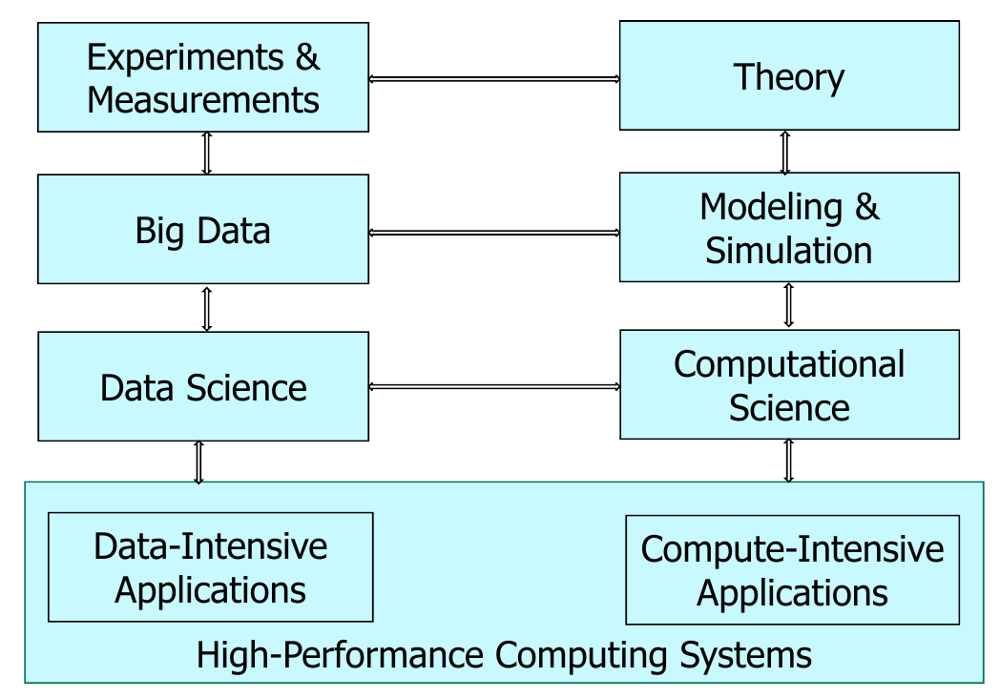

In [2]:
Image(filename="bd_hpc.png")

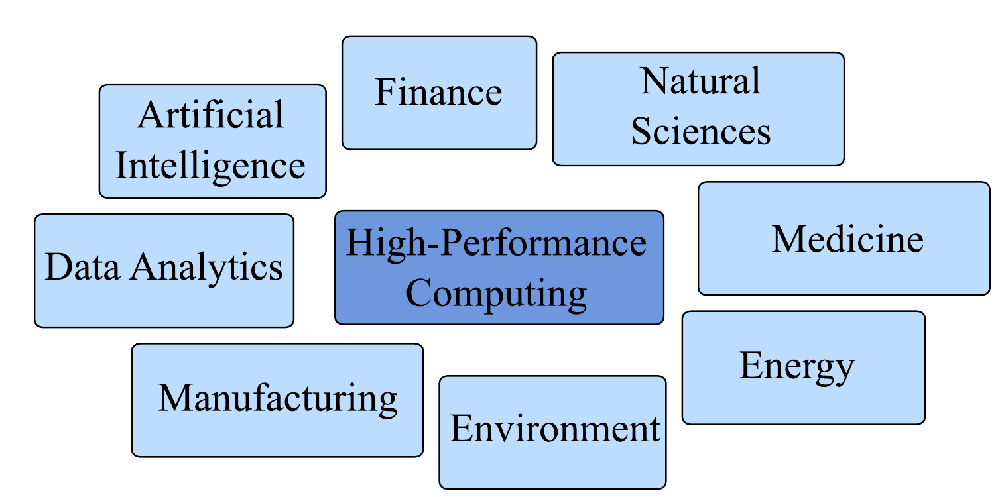

In [3]:
Image(filename="whyhpc1.png")

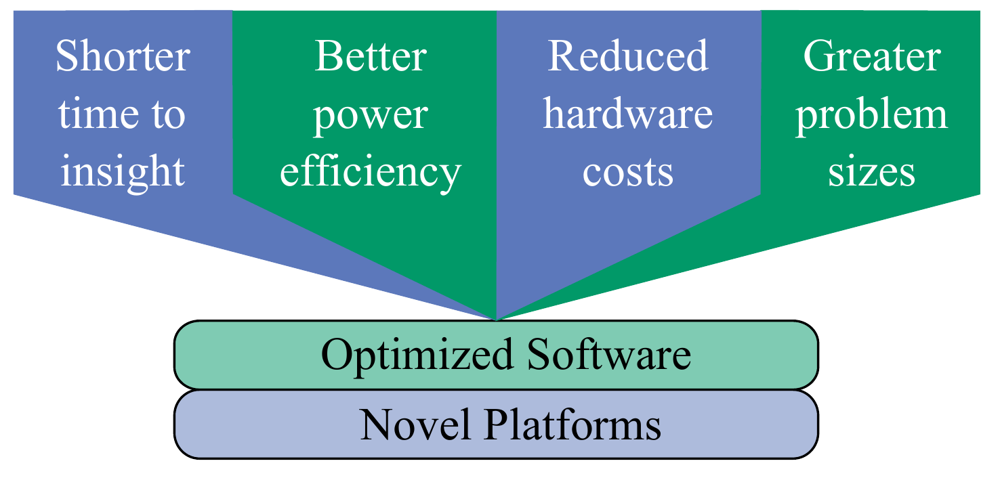

In [4]:
Image(filename="whyhpc2.png")

# Class goals:

1. Explain what factors force to consider parallel computing
2. Have an overview of parallel programming paradigms and patterns
3. Give an understanding of modern computer architectures from a performance point-of-view
    - Processor, [Cache, Memory subsystem]
    - Use x86-64 as a de-facto standard
    - Look at how accelerators are made
4. Explain hardware factors that improve or degrade program execution speed
5. How to do detailed performance measurements: highlight the most important events for such
measurements    



# Contents

[1. Setting the scene: Moore's Law and the power wall](#sec_01)  
[2. Some key concepts in parallel programming](#sec_02)  
[3. CPU architecture 101](#sec_03)  

<a id="sec_01"></a>

# Why worry about performance

- processors are currently sold in terms of clock speed,number of cores, cache dimension
- still in the late 90' clock speed was the only advertised item

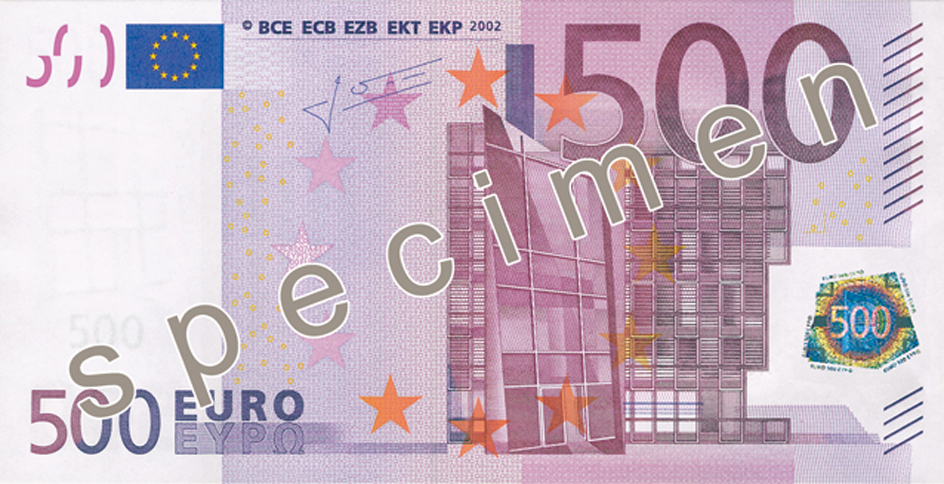

In [5]:
Image(filename="500eurofr_HR.jpg")

**how the previous one compares well to these ones?**

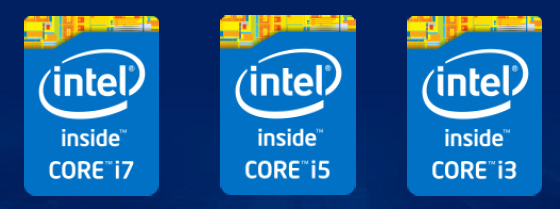

In [6]:
Image("photo-intel-haswell-core-4th-gen-logos.jpg")

what we want to measure it:
1. performance in terms costs; even "commodity hardware costs" grow up in large facilities
2. performance per Watt; let loose your 1kW GPU mining rig at home and then you 'll know

### Moore's law

In 1965$^{(1)}$, Intel co-founder Gordon Moore predicted (from just **3** data points!) that semiconductor density would double every 18 months.
–  He was right! Transistors are still shrinking at the same rate

$^{(1)}$Moore, G.E.: Cramming more components onto integrated circuits. Electronics, 38(8), April 1965.

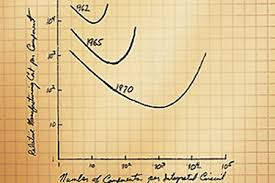

In [7]:
Image("moores.jpeg")

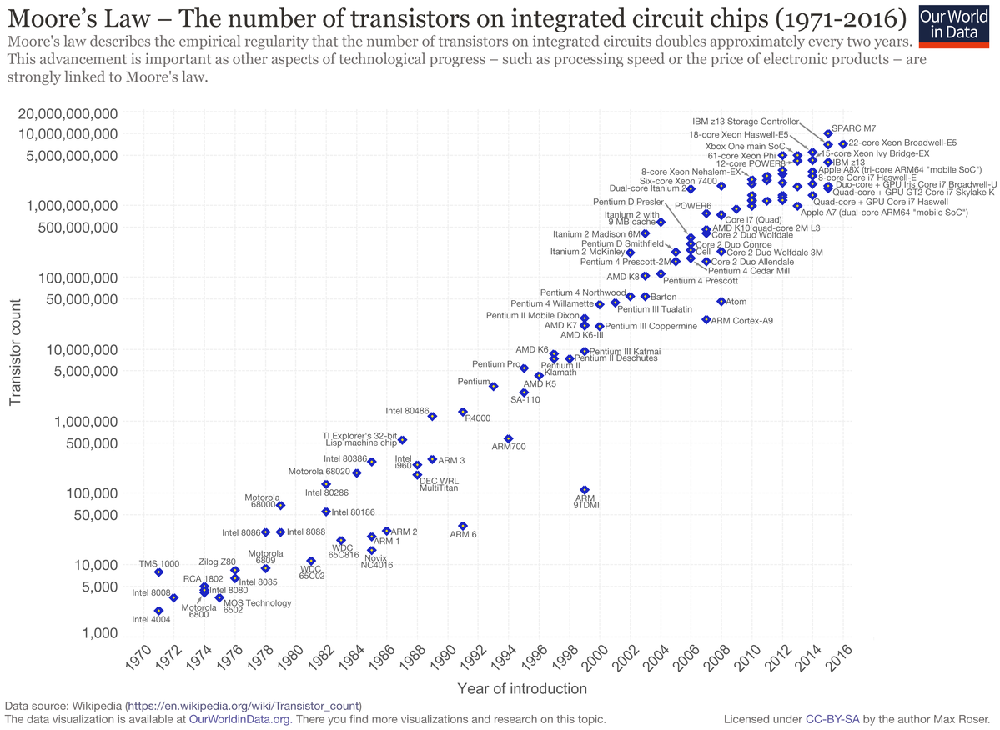

In [8]:
Image("1200px-Moore's_Law_Transistor_Count_1971-2016.png")

available [here](#http://www.monolithic3d.com/uploads/6/0/5/5/6055488/gordon_moore_1965_article.pdf)

This has become a de-facto standard accepted by:
- Semiconductor manufacturers (Intel, ARM, AMD)
- Hardware integrators (e. g. Asus)
- Software companies (pick your)
- Customers (that is, we)

**Consequences**: An incredible level of integration
- CPUs: Many-core, Hardware vectors, Hardware threading
- GPUs: Enormous number of floating- point units

right now, we just assume that stuff like hardware threads, cores, whatever are different
computing elements in one integrated chip

Today, we commonly acquire chips with 1’000’000’000 (10$^9$) transistors!  
Server chips and high-end GPU devices have more:

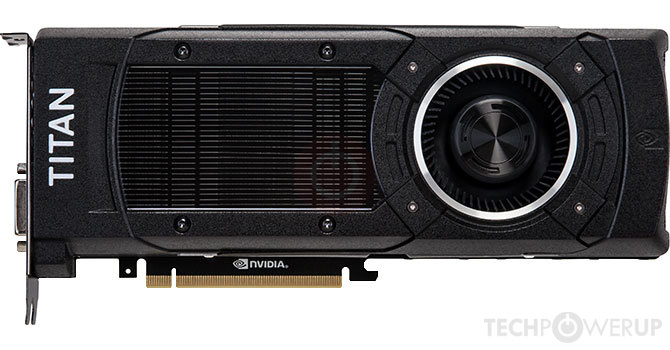

In [9]:
Image("titan.jpg")

-GPU Name:	GM200  
-GPU Variant:	GM200-400-A1  
-Architecture:	Maxwell 2.0  
-Process Size:	28 nm  
-Transistors:	8,000 million  
-Die Size:	601 mm$^2$

**But if computers double their power every 18 months we don't need to worry about performance**

not quite

That used to be the case in the "days of the Pentium":

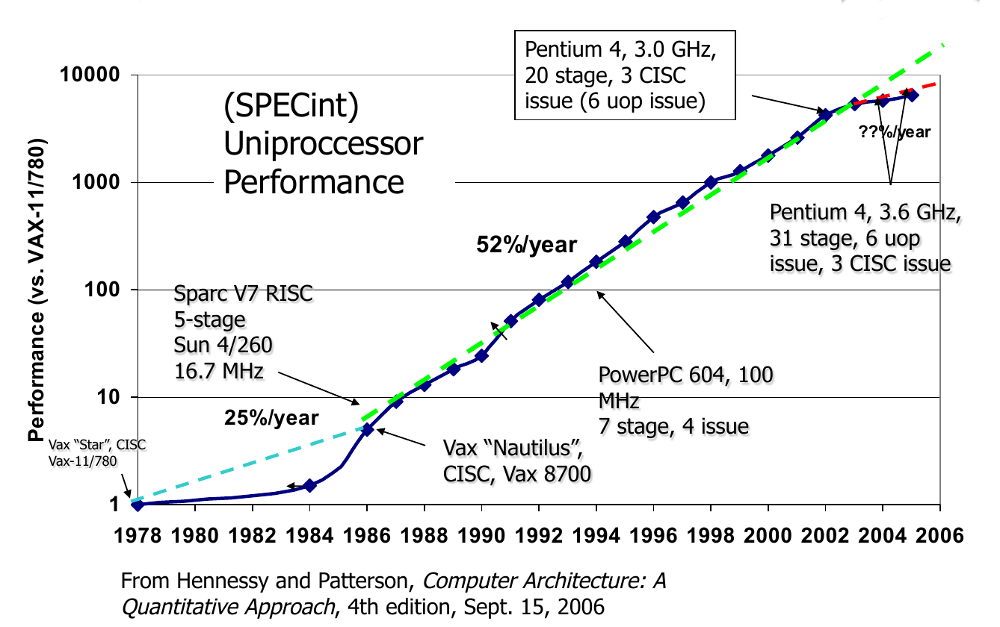

In [10]:
Image("oldays.png")

a implicit agreement:
- write your code as you want
- performance is a problem of those smart guys of the hardware dept.

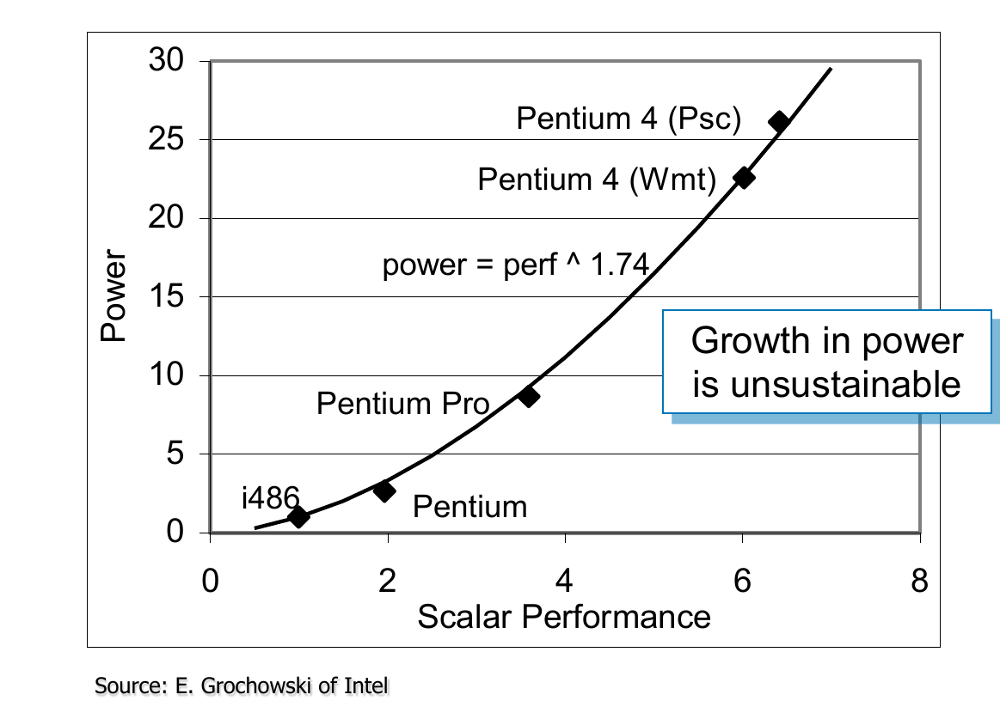

In [11]:
Image("power.png")

not only this sucks up a lot of energy (and money) but creates a lot of heat as $Q\propto P$

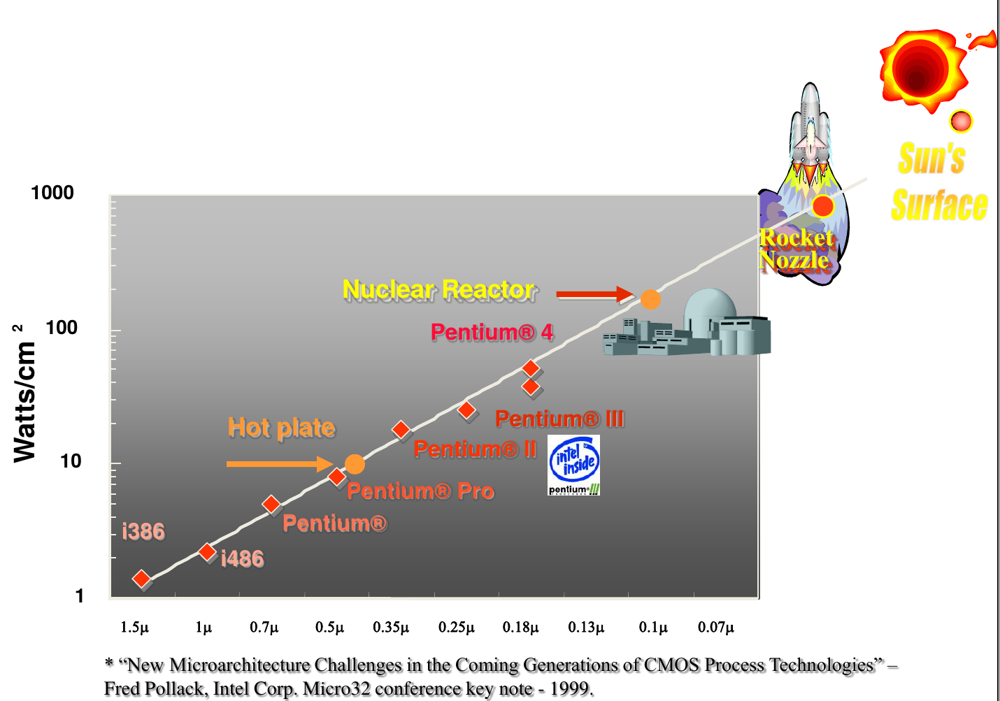

In [12]:
Image("sun.png")

see also: [1]S. H. Fuller and L. I. Millett, “Computing Performance: Game Over or Next Level?,” Computer, vol. 44, no. 1, pp. 31–38, Jan. 2011.

so what solution did the smart guys at HW dept. invent?

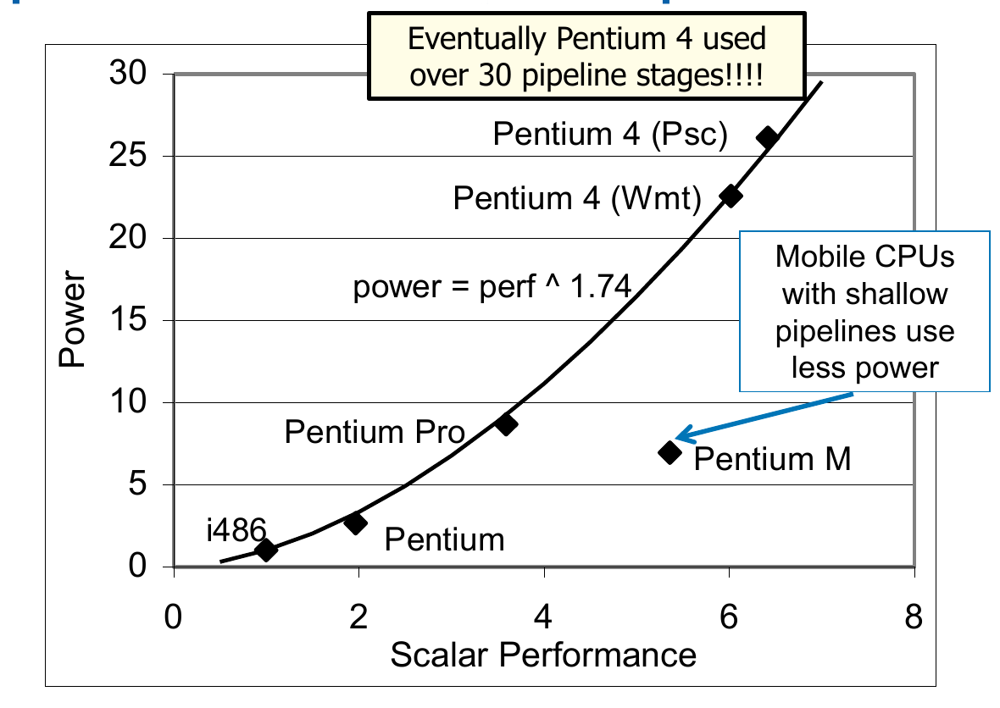

In [13]:
Image("power2.png")

### Possible solutions?

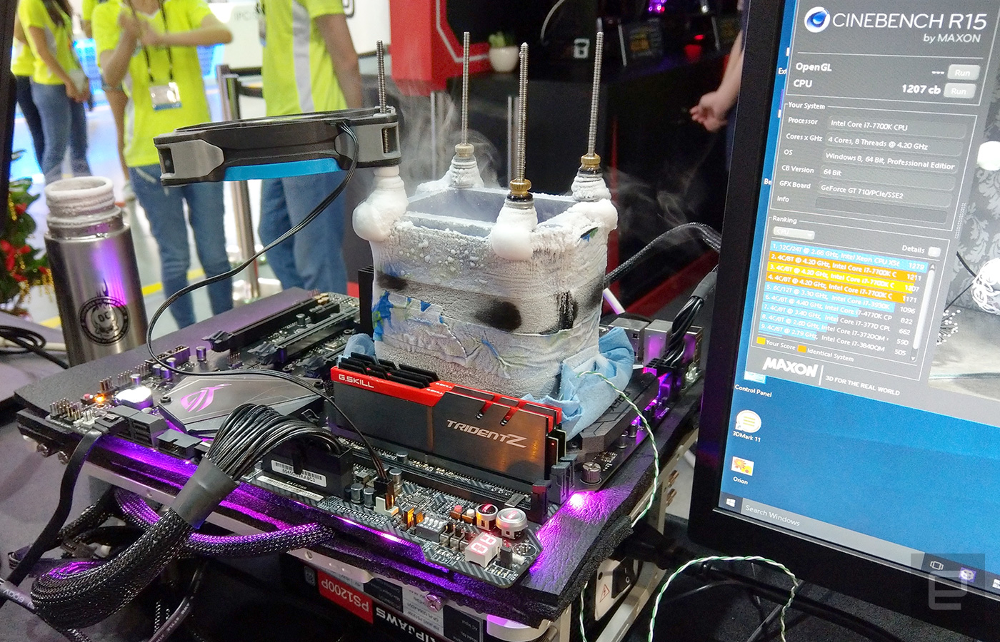

In [14]:
Image("gskill-hwbot-overclock-kit-cinebench-r15.jpg")

... nitrogen cooling is cool (literally) but quite expensive

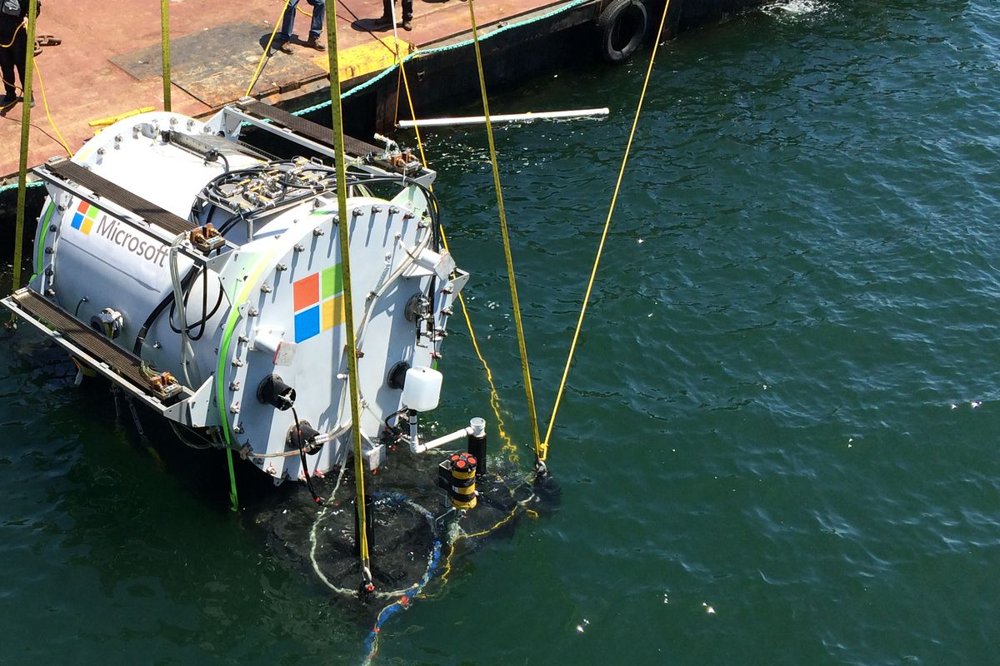

In [15]:
Image("natick.jpg")

this one may be rather difficult if you are not a scuba lover  
and we still have to pay the electricity bill

### Power consumption in a chip

To switch faster (increase frequency) we have drive current trought a circuit more quickly. Now, the circuit has various fixed resistances, hence (naively) we to increase voltage (all things equal):
$$V=IR$$

How much power it consumes? At any time the circuit hold a charge $q=CV$ and hence performs a work equal to:  
$$W=qV=CV^2$$

power consupmtion (plus fixed terms) is ($f$ is the operating frequency):
$$Wt^{-1}=Wf=CV^2f$$

Consider now what happens splitting the CPU in two cores operating at half the clock speed:

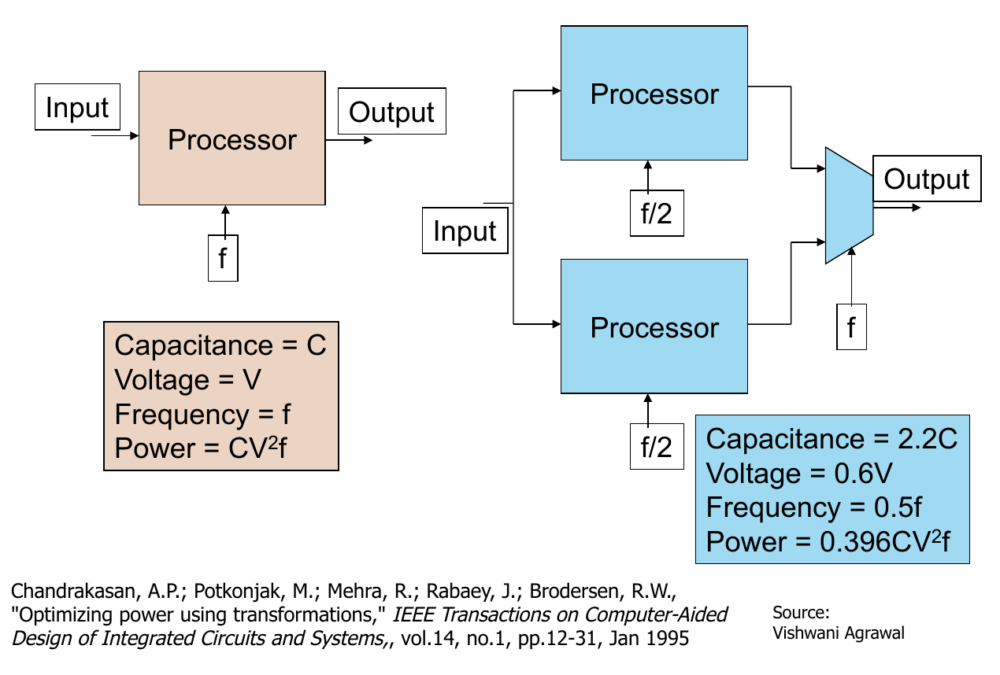

In [16]:
Image("more_cores.png")

[1]S. H. Fuller and L. I. Millett, “Computing Performance: Game Over or Next Level?,” Computer, vol. 44, no. 1, pp. 31–38, Jan. 2011.

As a practical example the E5640 Xeon (4 cores @ 2.66 GHz) has a power envelope of 95 watts while the L5630 (4 Cores @ 2.13 GHz) requires only 40 watts. That's 137% more electrical power for 24% more CPU power for CPU's that are for the most part feature compatible. The X5677 pushes the speed up to 3.46 GHz with some more features but that's only 60% more processing power for 225% more electrical power.

Now compare the X5560 (2.8 GHz, 4 cores, 95 watts) with the newer X5660 (2.8 GHz, 6 cores, 95 watts) and there's 50% extra computing power in the socket

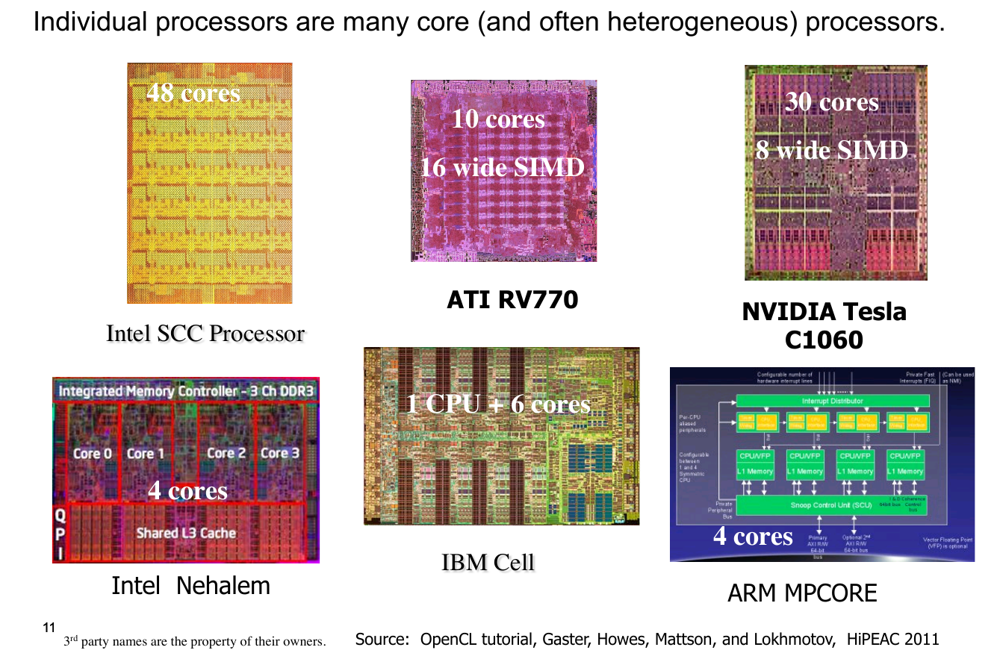

In [17]:
Image("manycores.png")

note that three out six here come from the game industry

but what about the gentleman agreement with the HW dept.

well ...

we have to cope with this new contract:
HW dept. will continue to add transistors (in lots of simple cores) ...  
... and SW dept. will have to adapt (rewrite everything).

That's way we have to worry about parallel programming

**Market forces, not technology, will drive technology (core counts in this case)**  
(Nietzsche would like this one)

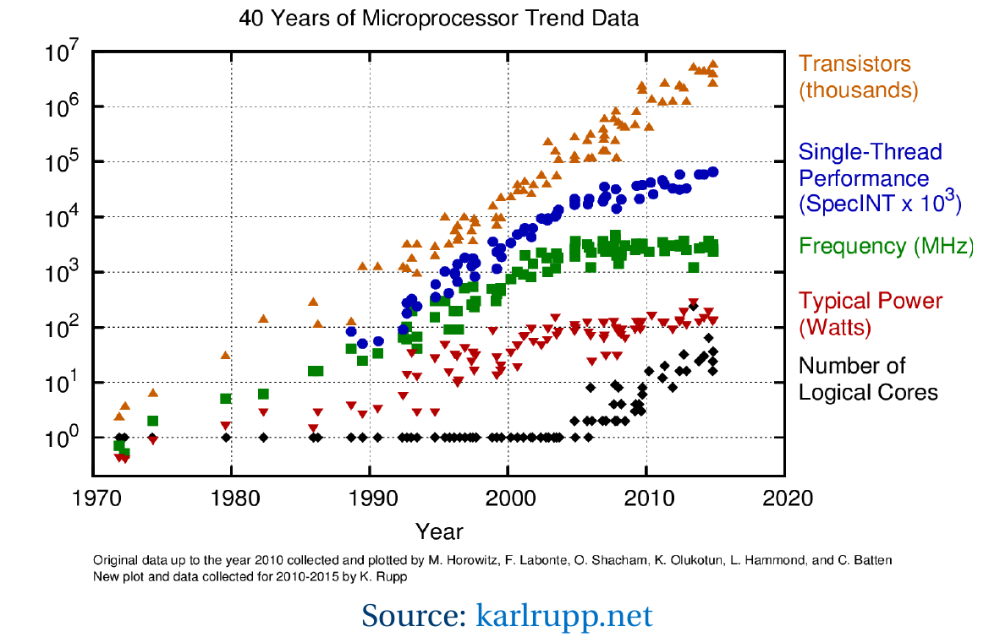

In [18]:
Image("manycores2.png")

Fragmentation into multiple execution units and more complicated logic creates additional hindrance for performance:
- ILP Wall (Instruction Level Parallelism)
- Memory Wall

**why so many "walls"?**

Computing units are "ancient":
- As “stupid” as 50 years ago
- Still based on the Von Neumann architecture
- Using a primitive “machine language”

Matrix/vector multiplication in assembly:
    
    __Z6matmulv (snippet):
    vmovlhps
    %xmm0, %xmm3, %xmm3
    vmovss
    +_b(%rip), %xmm4
    vinsertf128 $1, %xmm3, %ymm3, %ymm3
    vinsertps
    $0x10, 44+_b(%rip), %xmm7,
    vmovss
    48+_b(%rip), %xmm6
    vinsertps
    $0x10, 36+_b(%rip), %xmm1,
    vmovlhps
    %xmm0, %xmm2, %xmm2
    vinsertps
    $0x10, 60+_b(%rip), %xmm4,
    vxorps
    %xmm4, %xmm4, %xmm4
    <snip>

Even assembly is "too complicated":
    
- Intel translates “CISC” x86 assembly instructions into “RISC” micro-operations *which can vary with each CPU generation*
- NVIDIA translates PTX (parallel thread execution, or virtual assembly into machine instructions *which can vary with each GPU generation*
    
CISC: Complex Instruction Set Computing  
RISC: Reduced Instruction Set Computing

1. We start with a concrete, real-life problem to solve
2. We write programs in high level languages (C++, JAVA, Python, etc.)
3. A compiler (or an interpreter) transforms the high-level code to machine-level code
4. We link in external libraries
5. A sophisticated processor with a complex architecture and even more complex micro-architecture executes the code
6. <span style="color:red"> In most cases, we have little clue as to the efficiency of this transformation process</span>

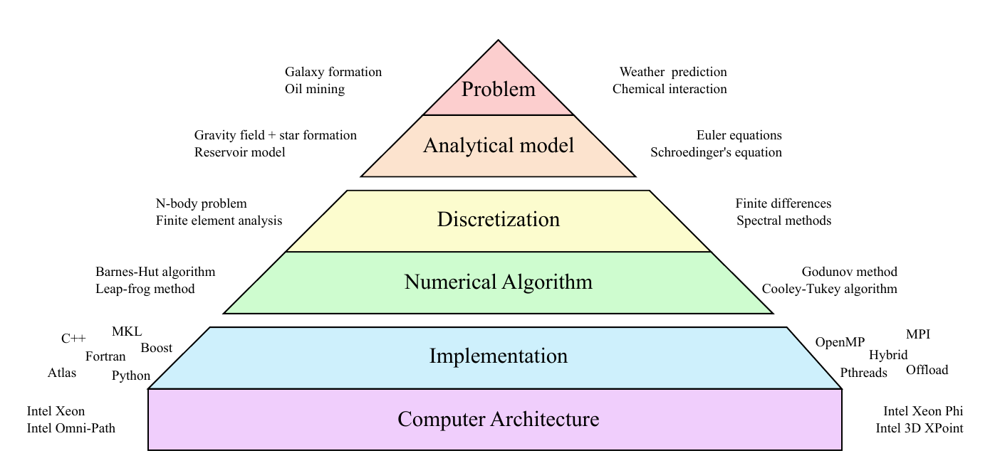

In [3]:
 Image("pyramid.png")

### Any good news?

few:
1. Parallel programming is not new, it's been around for many years since the "many core era"
2. By learning something about parallel programming our multicore CPU and shiny GP-GPU we can learn something about using supercomputers

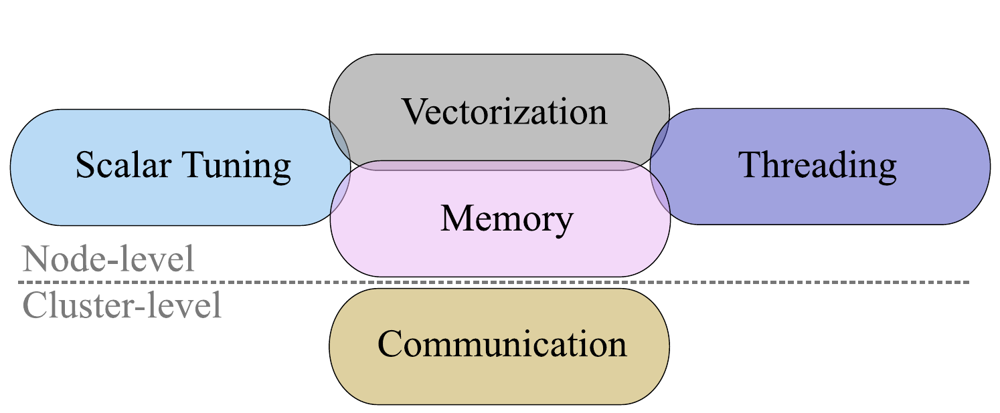

In [19]:
Image("opt_areas.png")

### Supercomputers

Much of modern computational science is performed on GNU/Linux clusters where multiple processors can be utilized and many calculations can be run in parallel. The biggest, built from non off shelf hardware, are dubbed "supercomputers".

The first supercomputer of history:

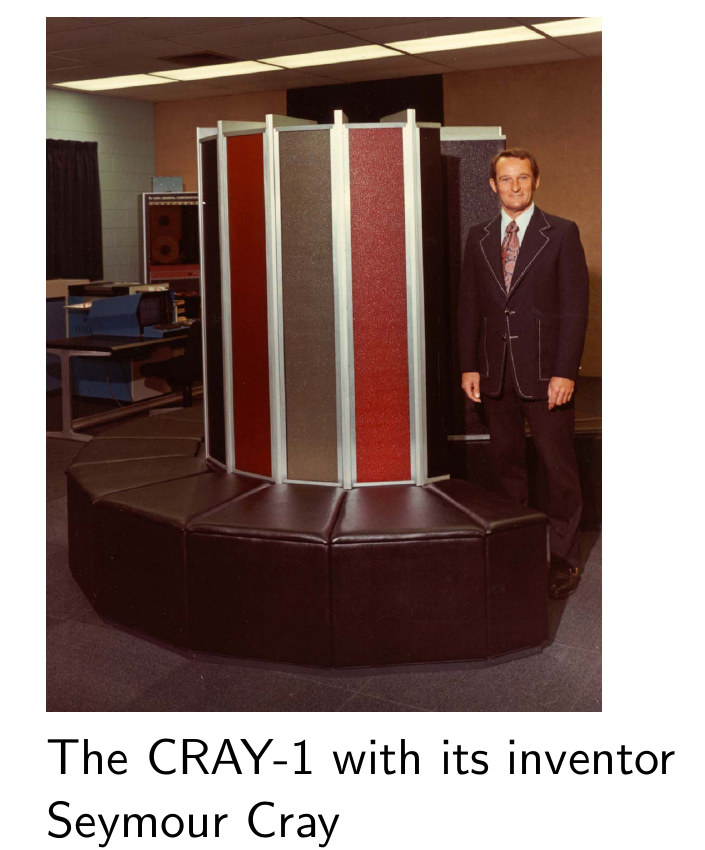

In [20]:
Image(filename="cray.png")

In mid-to-late 1970’s CRAY-1 was the fastest computer in the world.

Clock speed of 12.5ns (80MHz)
Computaional rate of 138 MFLOPS during sustained period.
Unveiled in 1976 by its inventor Seymour Roger Cray Had spawned a new class of computer called ”The Supercomputer”.

The tree of HPC:

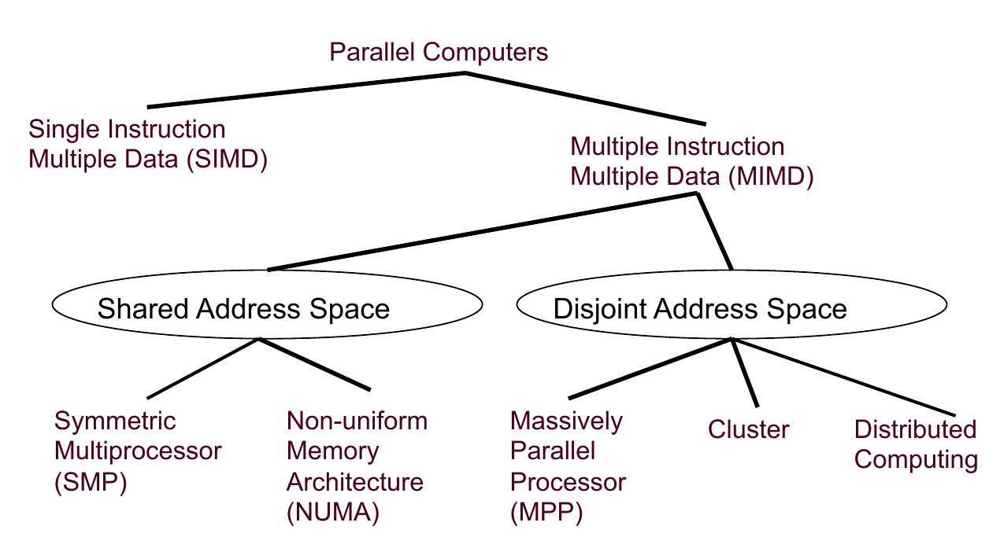

In [21]:
Image("archs.png")

#### The Cretacean of mainframes

- Large mainframes that operated on vectors of data
- Custom built, highly specialized hardware and software
- Multiple processors in an shared memory configuration
- Required modest changes to software (vectorization)

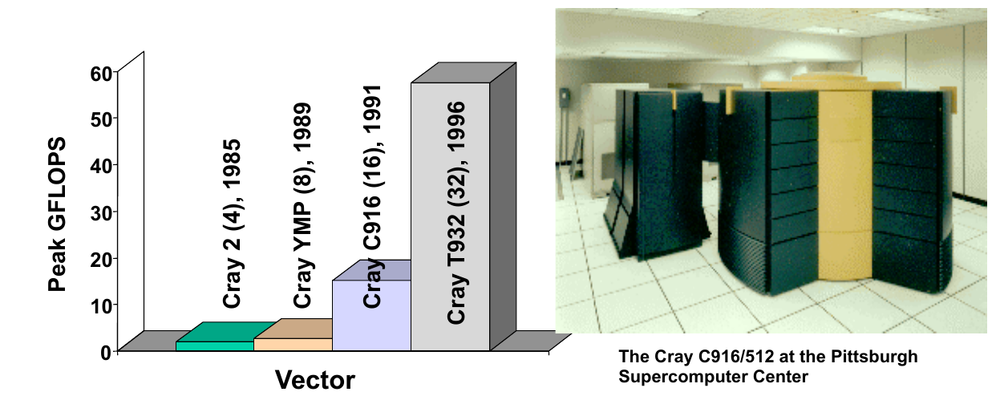

In [22]:
Image("mainframes.png")

#### The rise of micros

- The Caltech Cosmic Cube developed by Charles Seitz and Geoffrey Fox in 1981
- 64 Intel 8086/8087 processors with  128kB of memory per
processor
- 6-dimensional hypercube network

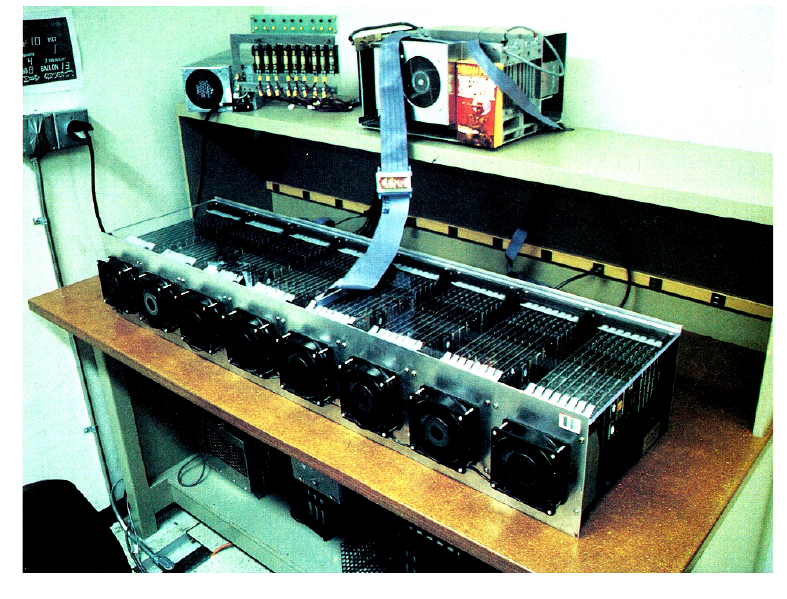

In [23]:
Image("cosmic_cube.png")

http://calteches.library.caltech.edu/3419/1/Cubism.pdf

Micros spawned the Many Parallel Processors era:
- Parallel computers with large numbers of microprocessors 
- High speed, low latency, scalable interconnection networks 
- Lots of custom hardware to support scalability
- Required massive changes to software (parallelization) 

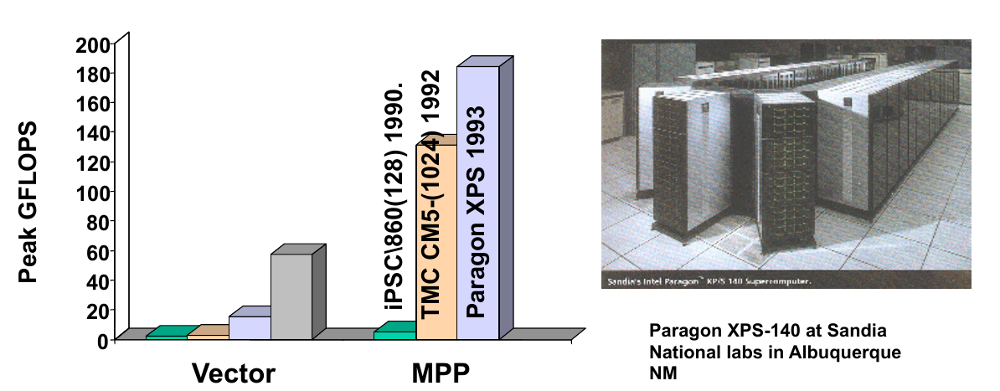

In [24]:
Image("mpps.png")

- MPPs using Mass market Commercial off the shelf (COTS) microprocessors and standard memory and I/O components
- Decreased hardware and software costs makes huge systems affordable

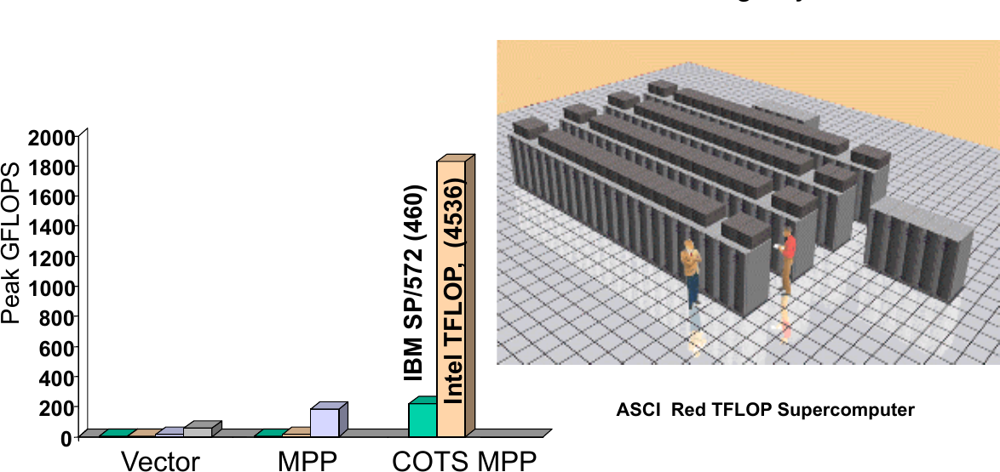

In [25]:
Image("mpps2.png")

#### Mass extictions caused by clusters
- A cluster is a collection of connected, independent computers that work in unison to solve a problem.
- Nothing is custom ... motivated users could build cluster on their own 
- The Intel Pentium Pro in 1995 coupled with Linux made them competitive.
- NASA Goddardʼs Beowulf cluster demonstrated publically that high visibility science could be done on clusters. 

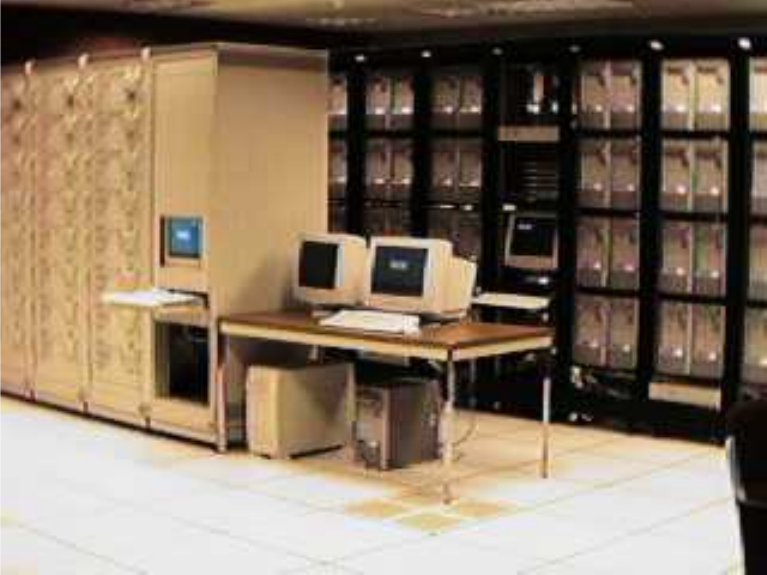

In [26]:
Image("goddard.png")

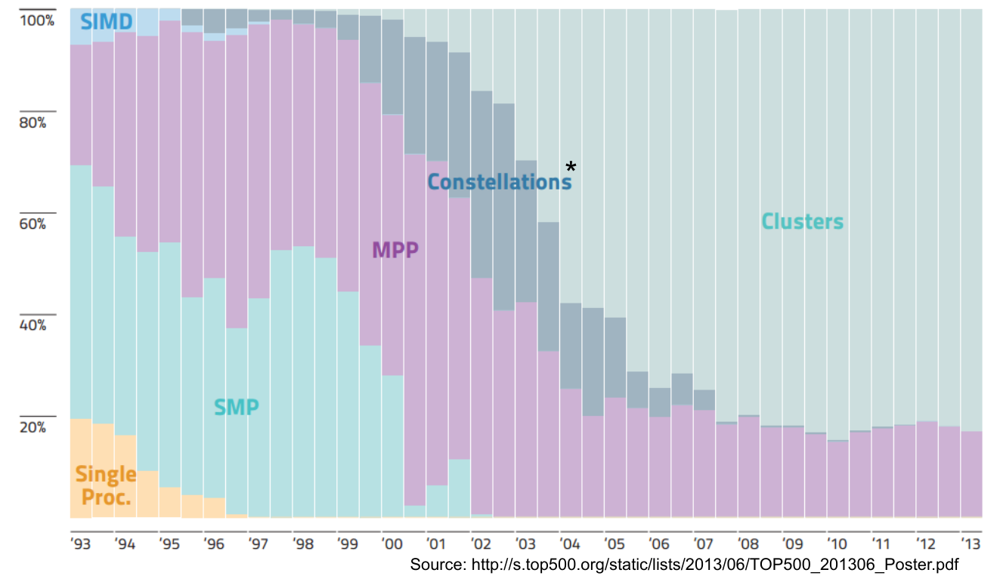

In [27]:
Image("constellation.png")

The current listing of the "biggest of biggest" can be found on www.top500.org (see also www.green500.org)

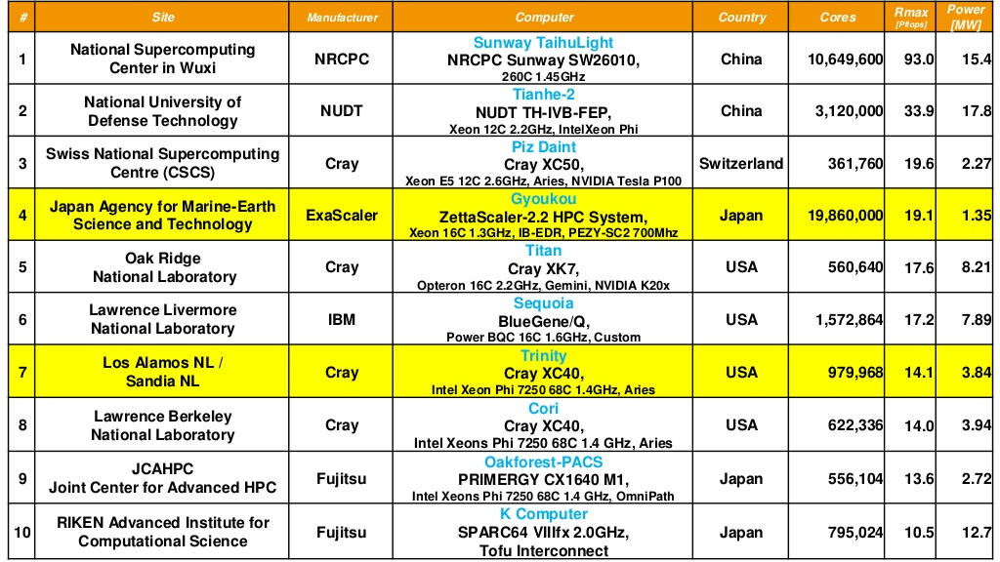

In [28]:
Image("top500-november-2017-2-1024.jpg")

Distribution of top500 systems in the world

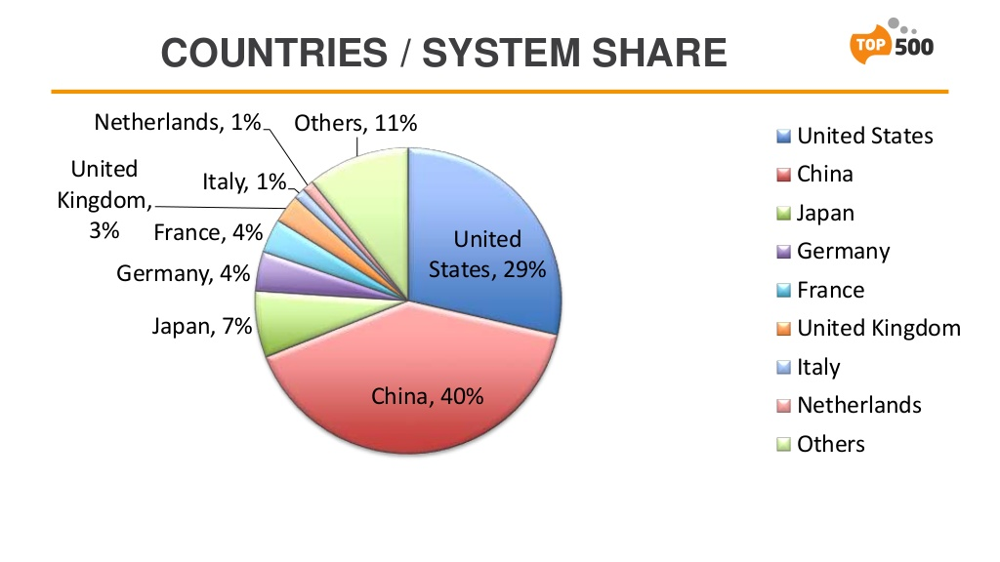

In [29]:
Image("top500-november-2017-9-1024.jpg")

Trend over time:

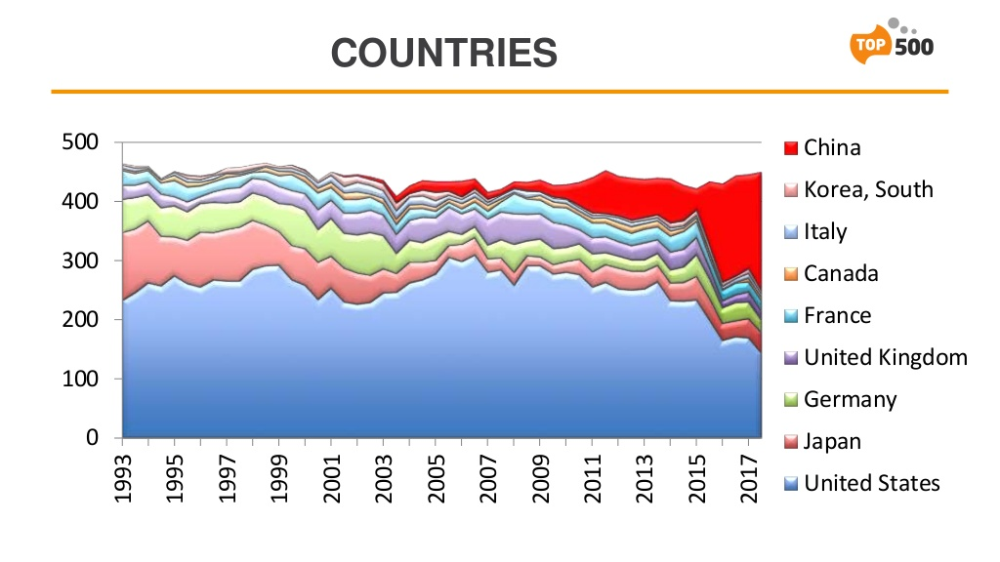

In [30]:
Image(filename="top500-november-2017-10-1024.jpg")

<a id="sec_02"></a>

# Key Concepts in Parallel computing

- Basic definitions: Parallelism and Concurrency
- Notions of parallel performance

**Band**  
amount of data moved over time unit. Measured in $bytes\  s^{-1}$ (hard disks) and $bit\  s^{-1}$ (sockets and nodes)

**Latency**
minimum time needed to assign a requested resource

**Performance**
number of 64 bit floating point operations per second

**Concurrency**
A condition of a system in which multiple tasks are logically active at one time.

**Parallelism**
A condition of a system in which multiple tasks are actually active at one time."

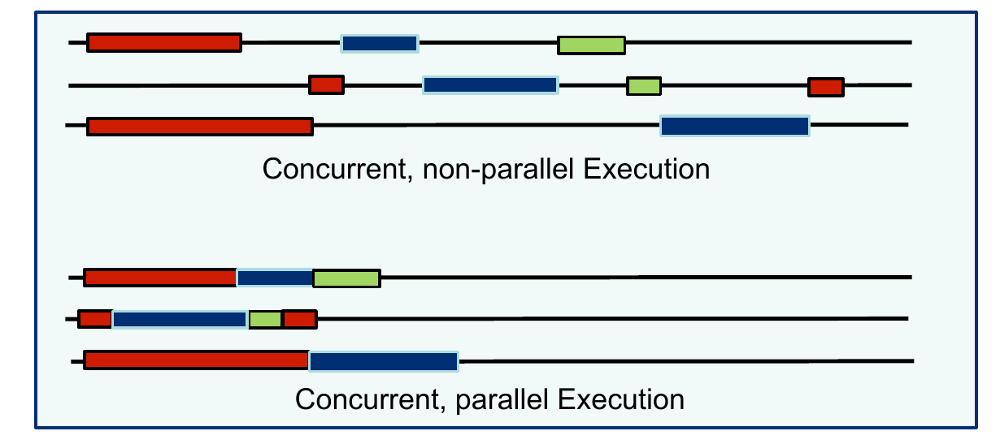

In [31]:
Image(filename="parallel.png")

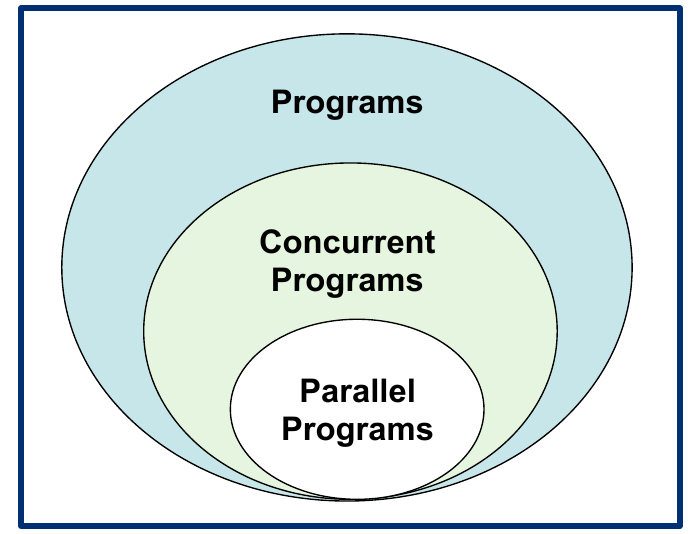

In [32]:
Image("conc_vs_par.png")

Figure from “An Introduction to Concurrency in Programming Languages” by J. Sottile, Timothy G. Mattson, and Craig E Rasmussen, 2010

An example:
- A Web Server is a Concurrent Application (the problem is fundamentally defined in terms of concurrent tasks):  
    - An arbitrary, large number of clients make requests which reference per-client persistent state
- An Image Server, which relieves load on primary web servers by storing, processing, and serving only images


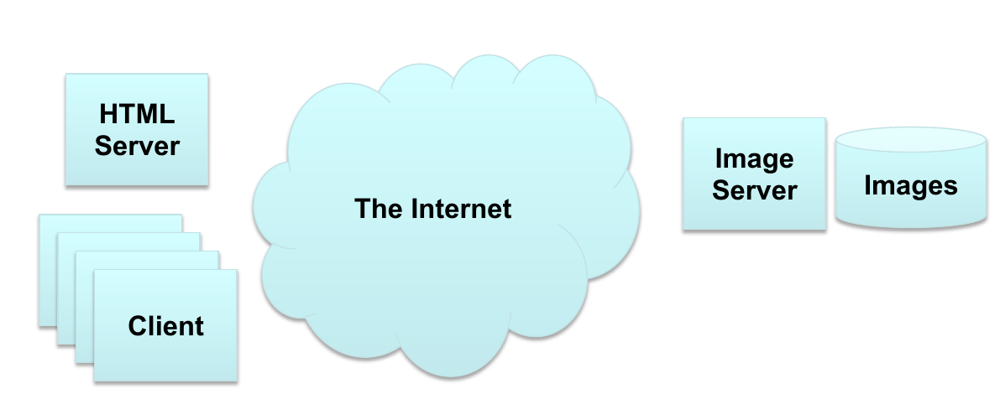

In [33]:
Image("web_server_1.png")

The HTML server, image server, and clients (you have to plan on having many clients) all execute at the same time  
The problem of one or more clients interacting with a web server not only contains concurrency, the problem is fundamentally current. It doesnʼt exist as a serial problem.  
  
    
**Concurrent application**: An application for which the problem definition is fundamentally concurrent.

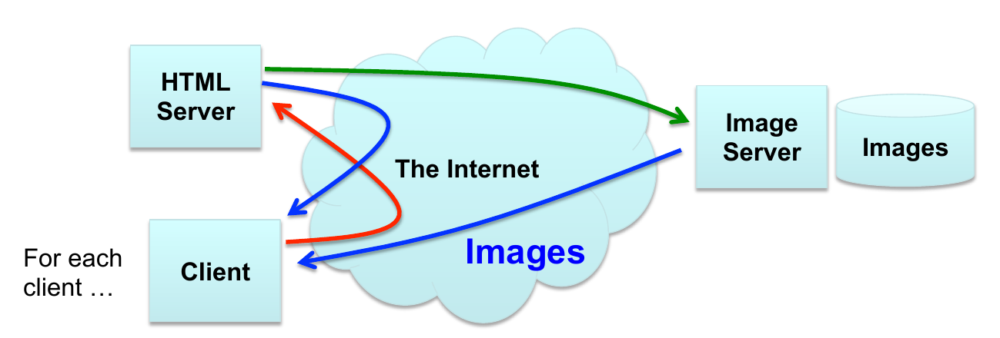

In [34]:
Image("web_server_2.png")

Another example: Mandelbrot's set  
The Mandelbrot set is an iterative map in the complex plane:  
$$ z_{n+1}^2 = z_{n}^2 + c $$
where $c$ is a constant and $z_0=0$.  
Points that do not diverge after a finite number of iterations are part of the set.  

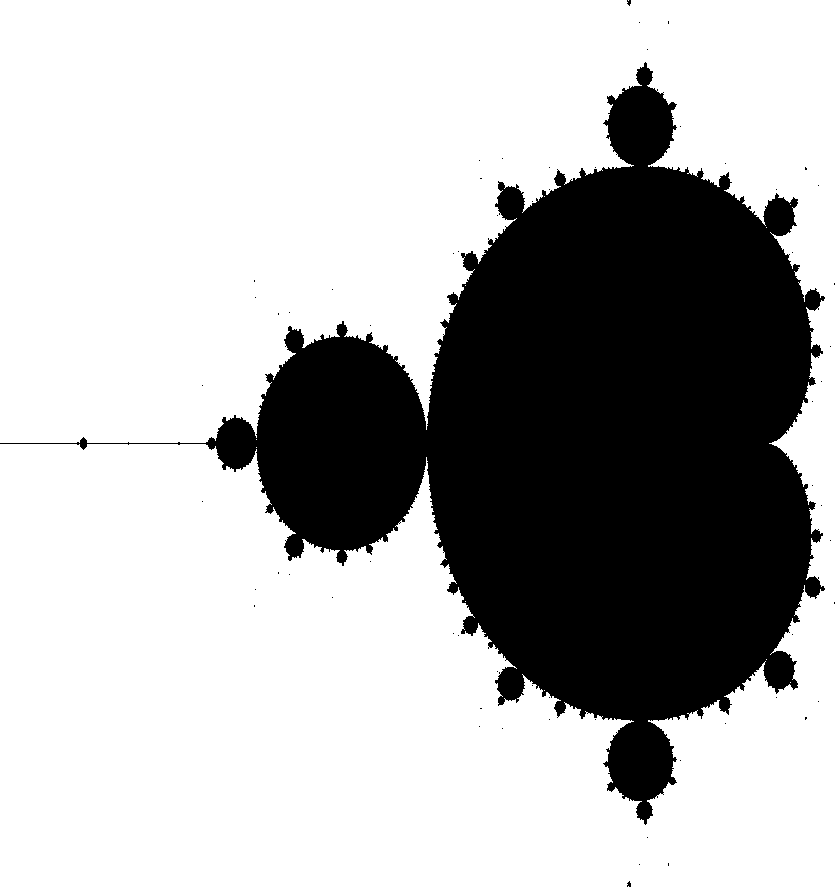

In [35]:
Image("out.png")

To generate the famous Mandelbrot set image, we use the function mandel(C) where C comes from the points in the complex plane. "


- At each point C, use n=mandel (C) to determine if: 
    - The map converges (n=max_iters), assign the color black
    - The map diverges (z>a given treshold after n<max_iters), assign the color based on the value of n

The computation for each point is independent of all the other points ... a so-called *embarrassingly parallel
problem*


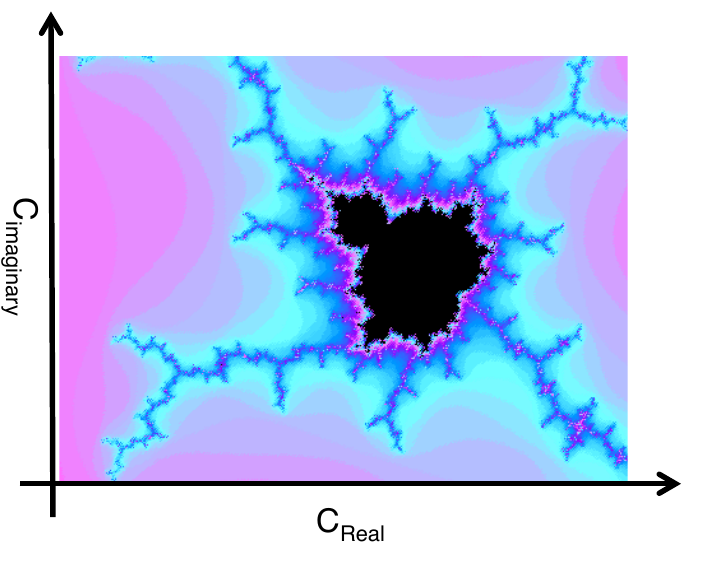

In [36]:
Image("mandel2.png")

    int mandel(double x0, double y0, double tr, int maxiter)
    {
        double re  = 0.0;
        double im  = 0.0;
        double re2 = 0.0;
        double im2 = 0.0;
        int k;

        for (k = 1; k < maxiter && (re2 + im2 < tr); k++) 
        {
            im = 2. * re * im + y0;
            re = re2 - im2 + x0;
            re2 = re * re;
            im2 = im * im;
        }    
        return k;
    }

    y0 = ymin 
    for (int i=0; i< height; i++)
    {
        x0 = xmin;
        for (int j=0; j < width; j++)
        {
            image[i][j] = mandel(x0,y0,horiz,maxiter);
            x0 = x0 + xres;
        }   
        y0 = y0 + yres;
    }// close on i   

- The problem of generating an image of the Mandelbrot set can be viewed serially.
- We  may choose to exploit the concurrency contained in this problem so we can generate the image in less time  

**Parallel application**: An application composed of tasks that actually execute concurrently in order to (1) consider larger problems in fixed time or (2) complete in less time for a fixed size problem.

How much we can gain from the parallelization (2048x2048 pixels, 1000 iterations and horizon at 3):

    [g.mancini@zama mandelbrot] time OMP_NUM_THREADS=1 ./mandelbrot.exe  
    real	0m4.406s  
    [g.mancini@zama mandelbrot] time OMP_NUM_THREADS=2 ./mandelbrot.exe  
    real	0m2.726s  
    [g.mancini@zama mandelbrot] time OMP_NUM_THREADS=4 ./mandelbrot.exe  
    real	0m2.401s      

**Key points**:
- A web server had concurrency in its problem definition ... it doesnʼt make sense to even think of writing a “serial web server”."
- The Mandelbrot program didnʼt have concurrency in its problem definition. It would take a long time, but it could be serial  

**The parallel programming process**

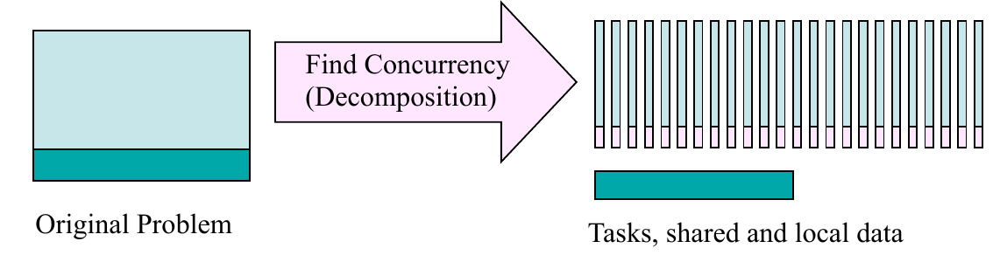

In [37]:
Image("ppar_process.png")

EVERY parallel program requires a task decomposition and a data decomposition:
- Task decomposition: break the application down into a set of tasks that can execute concurrently
- Data decomposition: How must the data be broken down into chunks and associated with threads/processes to make the parallel program run efficiently.

For the Mandelbrot set: map the pixels into row blocks and deal them out to the cores. This will give each core a memory efficient block to work on.

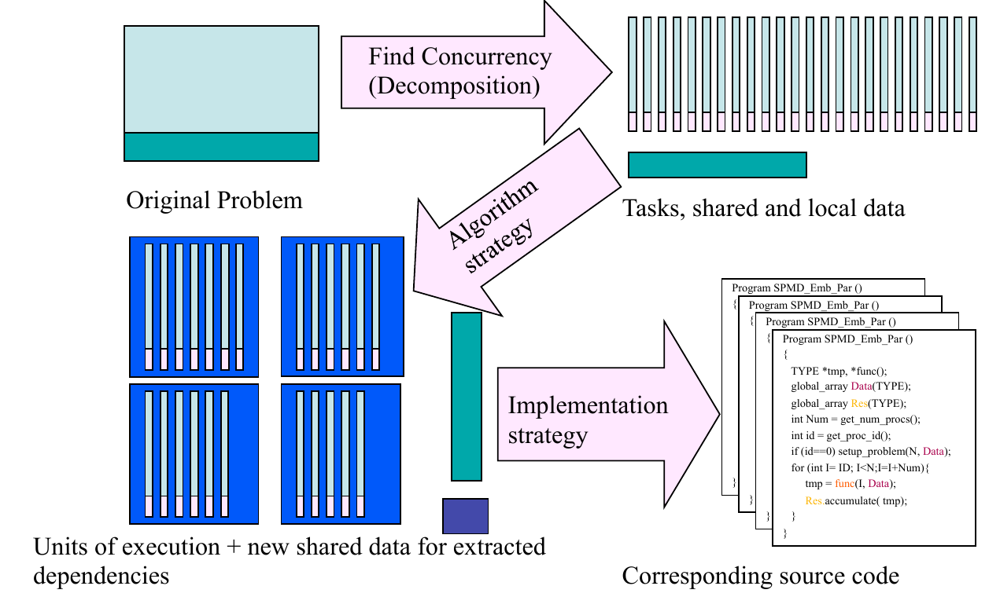

In [38]:
Image("ppar_process2.png")

### Parallel performance

How a "real life" parallel program is built?  
A large fraction of HPC applications (such as Molecular Dynamics) use a message passing notation with the Single Instruction Multiple Data or SIMD design pattern.

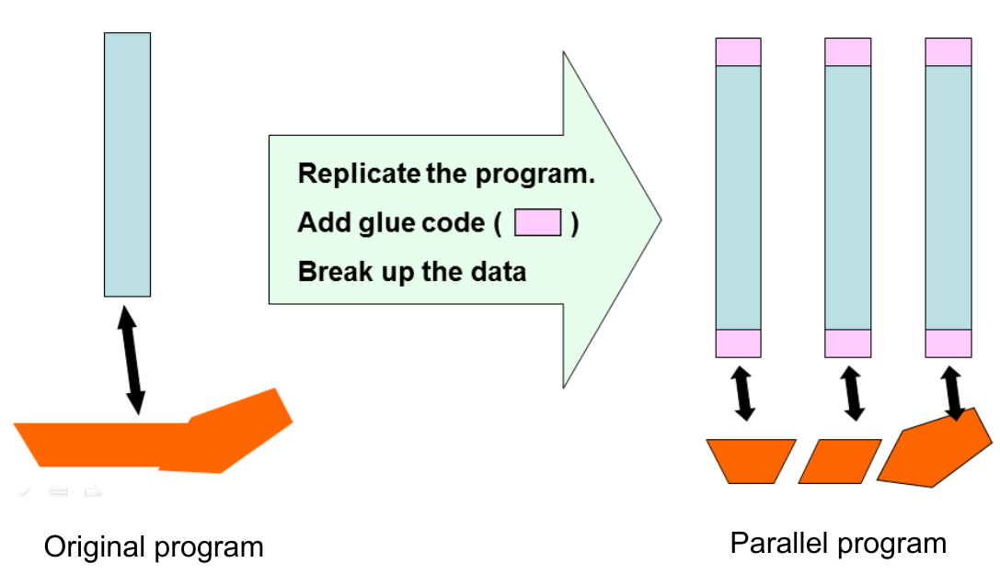

In [39]:
Image("glue.png")

An easy way to go is “Bulk Synchronous Processing”.

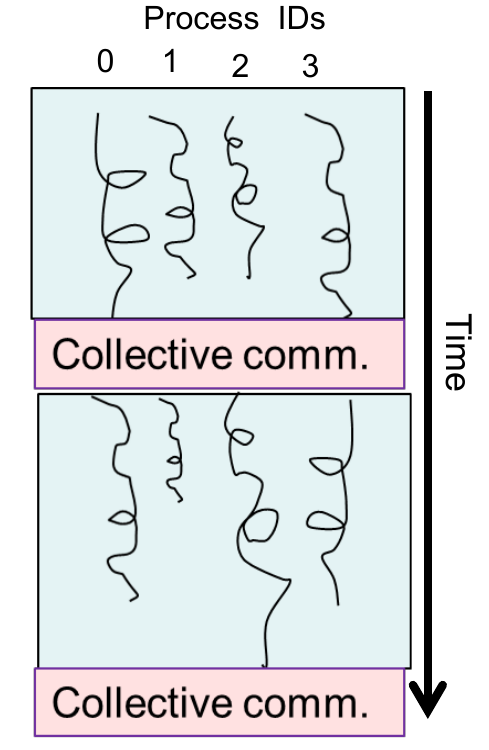

In [40]:
Image("bulk.png")

Is this efficent?  
How we can measure the outcome of our parallelization effort?

Let's consider the **Speedup** that we can gain from parallelization; a simple meaure would be:  
$$ S = \frac{T_{ser}}{T_{par}} $$

**Molecular Dynamics**

Simulate the motion of atom as point masses intercating by classical laws:
$$ m_i \frac{d^2}{dt^2}R_i(t) = -\nabla V(R) $$
$$ V = V_{bond} + V_{angle} + V_{tors} + V_{Coul} + V_{LJ}$$

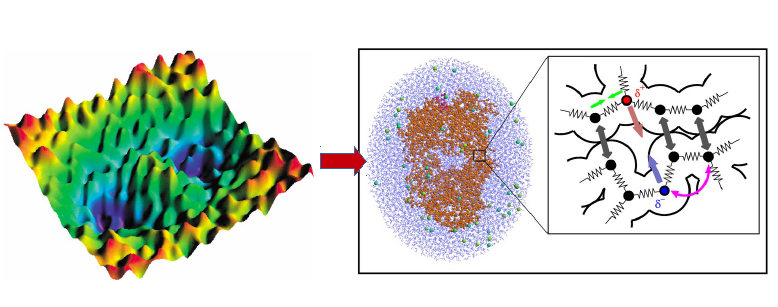

In [41]:
Image("PES.png")

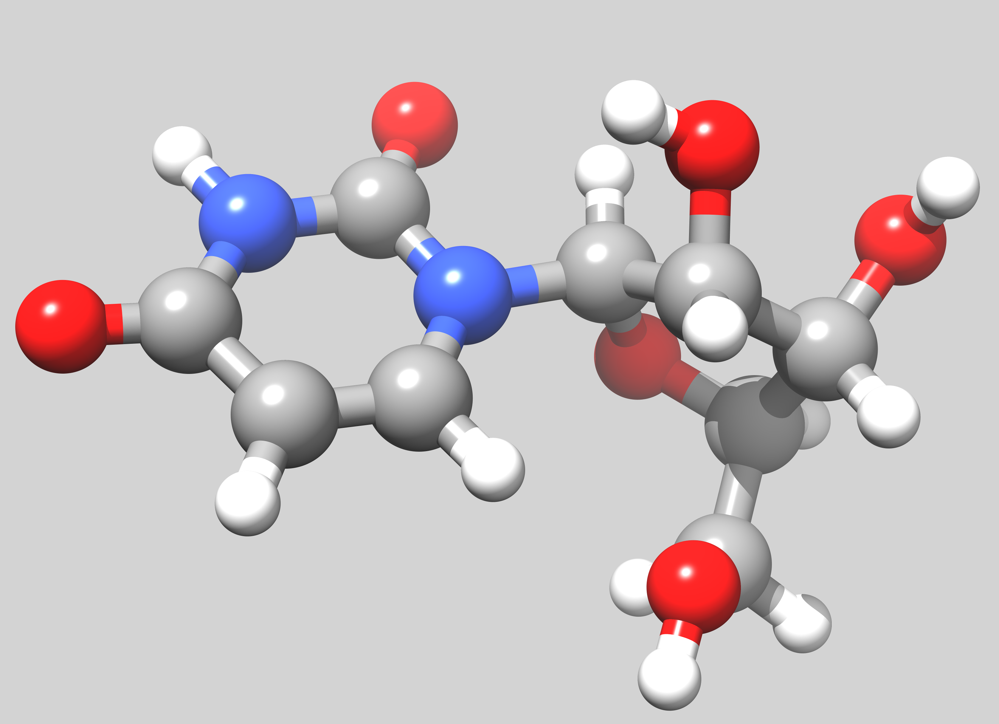

In [42]:
Image("image.png")

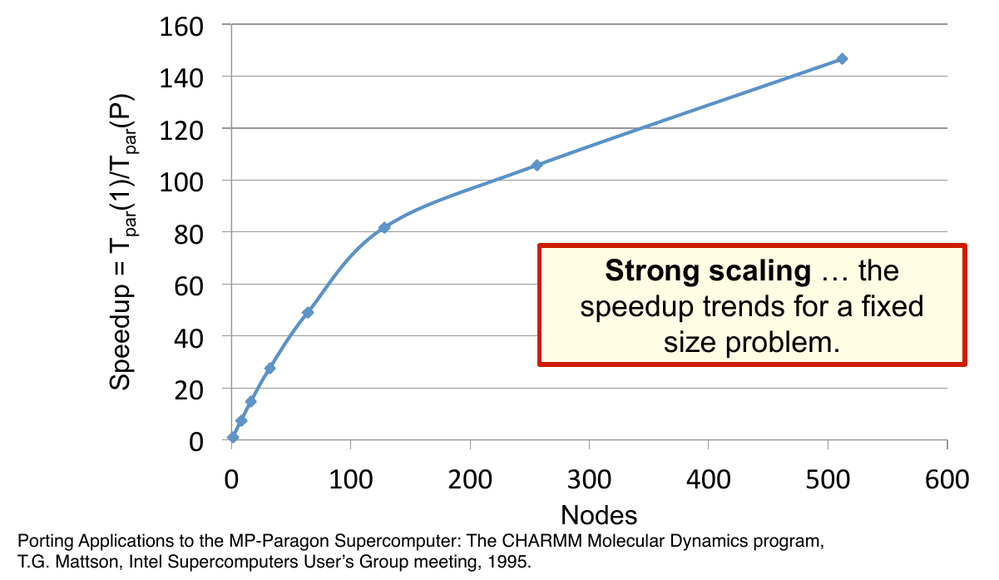

In [43]:
Image("charmm_bench2.png")

the speedup is not constant with the number of processors; why?  
let's get back to our Mandelbrot toy:

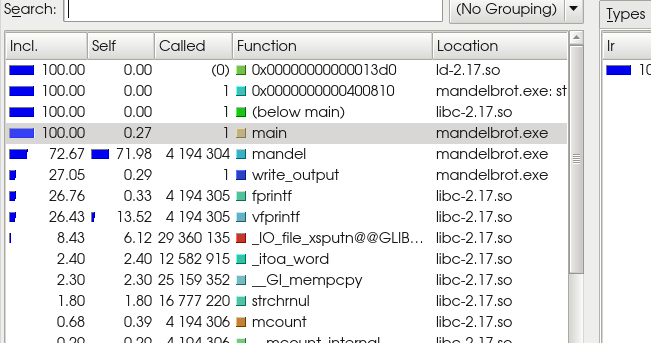

In [44]:
Image("kcache.png")

not every part of the code is run in parallel; even in a utopistic situation of linear speedup of parallel code that cost would stay fixed (for a fixed problem size).

    unsigned char colour[3];
    FILE * fp = fopen(filename,"w");
    fprintf(fp,"P3\n%d %d %d\n",width, height, 255);    
    for (int i=0; i< height; i++)
        for (int j=0; j < width; j++)
        {           
            if(image[i][j] >= maxiter)
            {
                colour[0] = 0;
                colour[1] = 0;
                colour[2] = 0;
            }
            else
            {
                colour[0] = 255;
                colour[1] = 255;
                colour[2] = 255;
            }
            fprintf(fp,"%d %d %d ",colour[0],colour[1],colour[2]);
        }

**Amdhal Law**

Consider a generic program running in serial mode, taking $T_{t}$ to be completed and made up by *serial part* and a *parallelizable part*. Then
$$ T_t = T_{ser} + T_{par} = f_s*T_{ser} + f_p*T_{ser}$$
where $T_{ser}$ is the time needed to run in serial and $f_s$, $f_p$ are the serial and parallel parts of the code

now, running in parallel we have (for a linear speedup):
$$T_{par} = \frac{T_{ser}}{p} = T_{ser}*f_s + f_p*\frac{T_{ser}}{p} = (\alpha+\frac{1-\alpha}{p})*T_{ser}$$   
if $\alpha=f_s$. The total speedup is then:
$$ S = \frac{T_{ser}}{T_{par}} = \frac{1}{\alpha+\frac{1-\alpha}{p}}$$

which goes to $1/\alpha$ with many processors

the maximum speedup for Mandelbrot is

In [45]:
1/0.27

3.7037037037037033

but there's still work to do:

In [46]:
4.406/2.726

1.6162876008804108

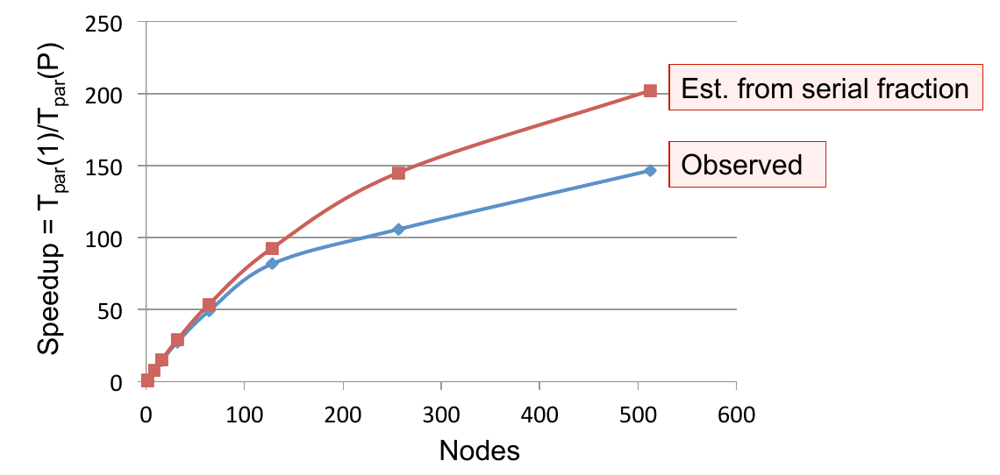

In [47]:
Image("charmm_bench3.png")

Two major sources of parallel overhead:

**Load imbalance**: the slowest process determines when everyone is done. Time waiting for other processes to
finish  is time wasted.

**Communication overhead**: A cost only incurred by the parallel program. Grows with the number of processes for collective comm

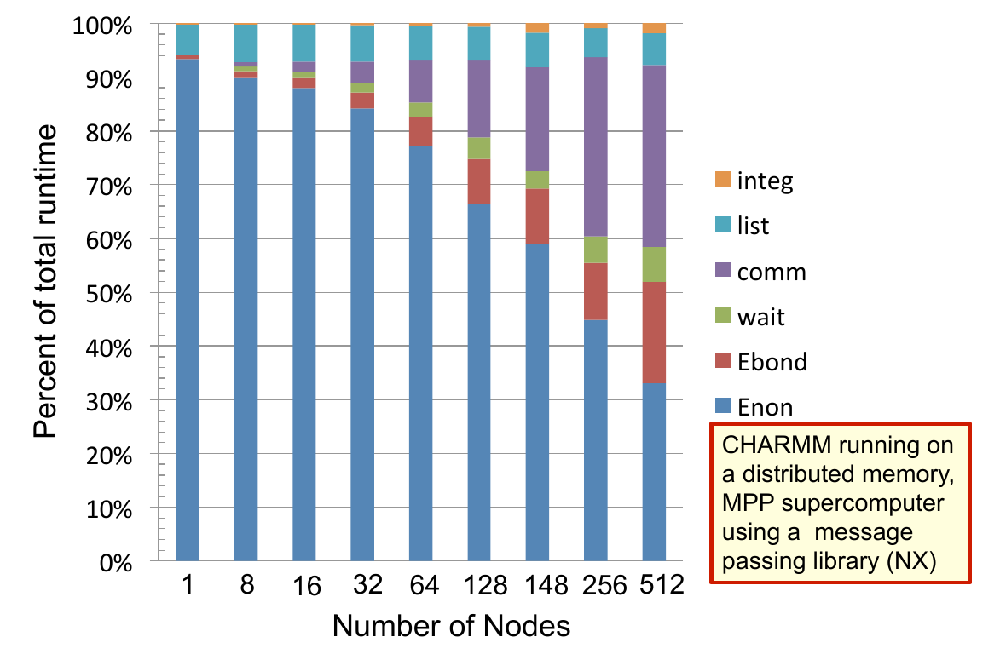

In [48]:
Image("charmm_bench.png")

**Weak scaling**

However: non bonded interactions (all vs all) scale as N^2 while bond scales as N (an atom tipically has that many neighbours). 
Hence, a serial (or less parallel) part may grow less than the parallel one for some problems.

$$ S(P) \to S(P,N) $$
$$ S(P,N) = \frac{T_{ser}}{T_{par}} = \frac{1}{\alpha+\frac{1-\alpha}{p}}$$
$$ N \to \infty  \Rightarrow \alpha \to 0 $$
$$ S(P,N)_{\alpha \to 0} = P $$

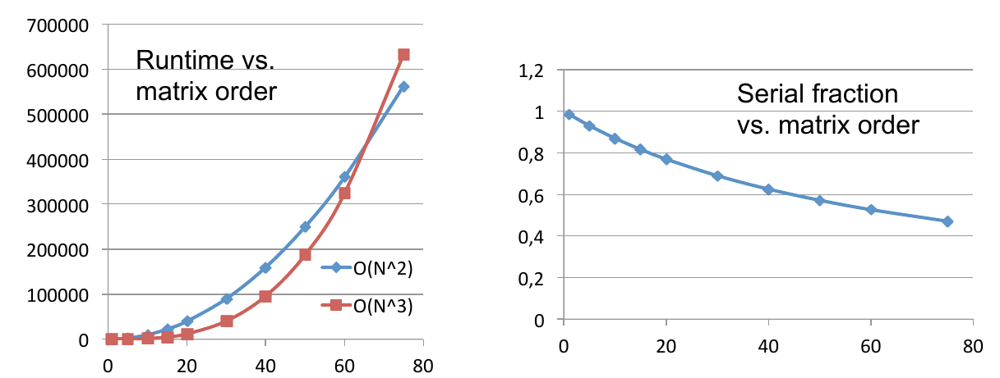

In [49]:
Image("dense_matrices.png")

### Parallel programming environments in the 90’s

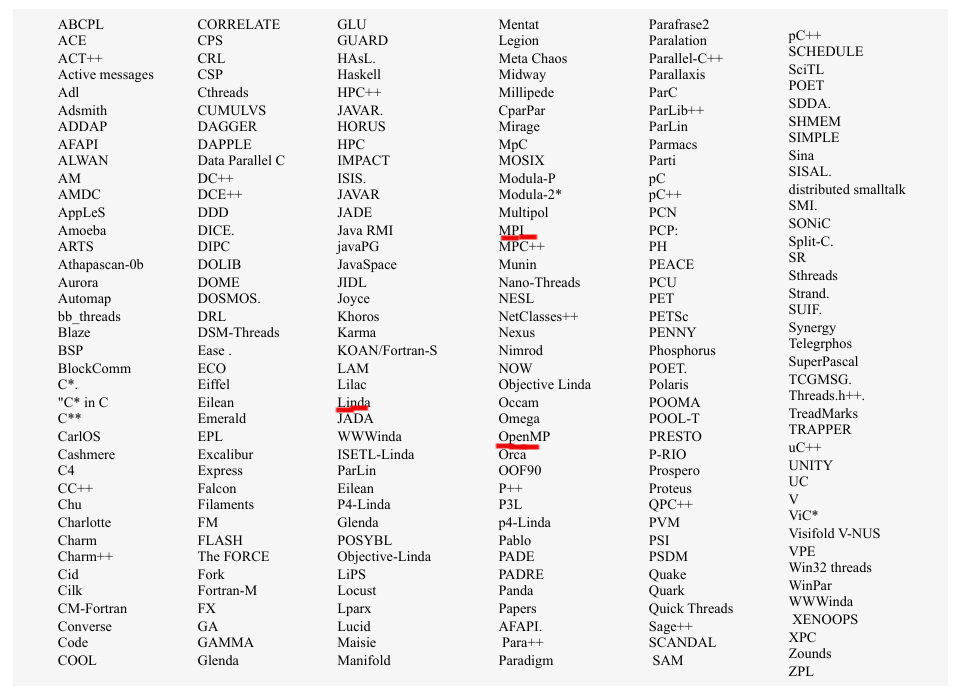

In [50]:
Image(filename="envs90.png")

Environments from the literature 2010-2012:

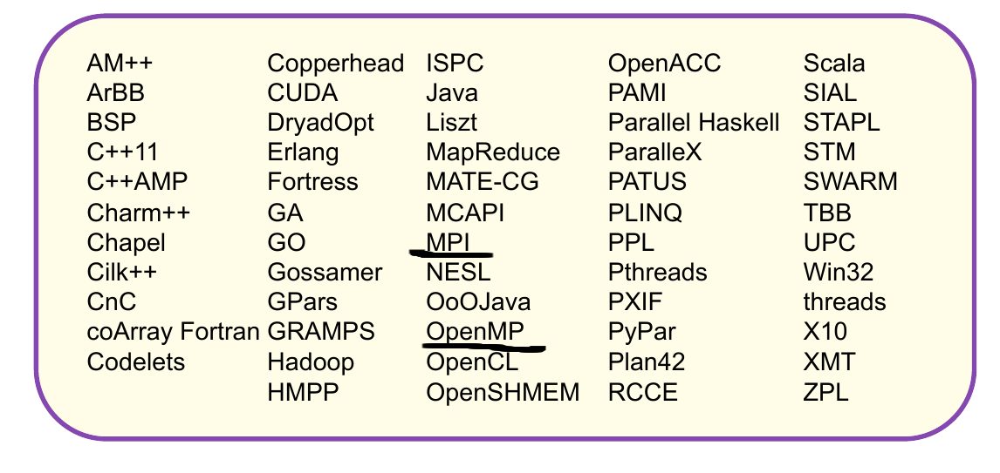

In [51]:
Image("envs10.png")

<a id="sec_03"></a>

# CPU architecture 101

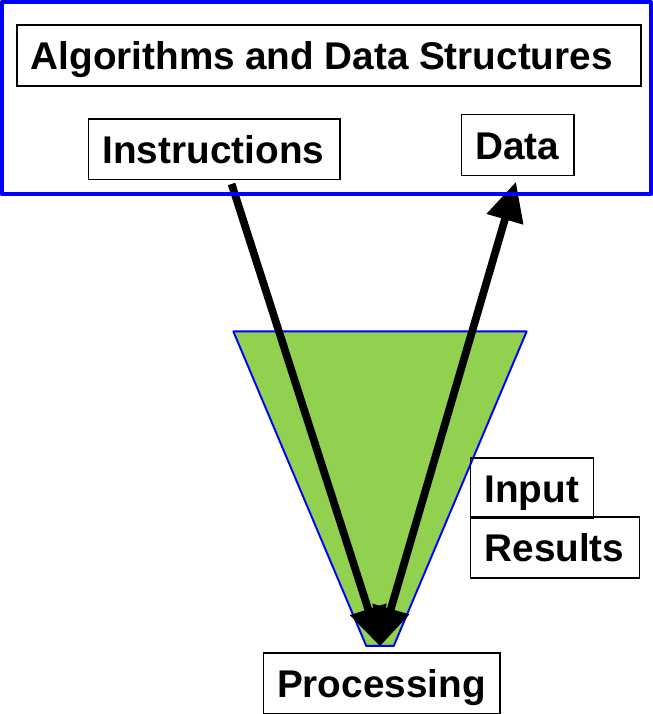

In [52]:
Image("von_neumann.png")

From Wikipedia: The von Neumann architecture is a computer design model that uses a processing unit and a single separate storage structure to hold both instructions and data.

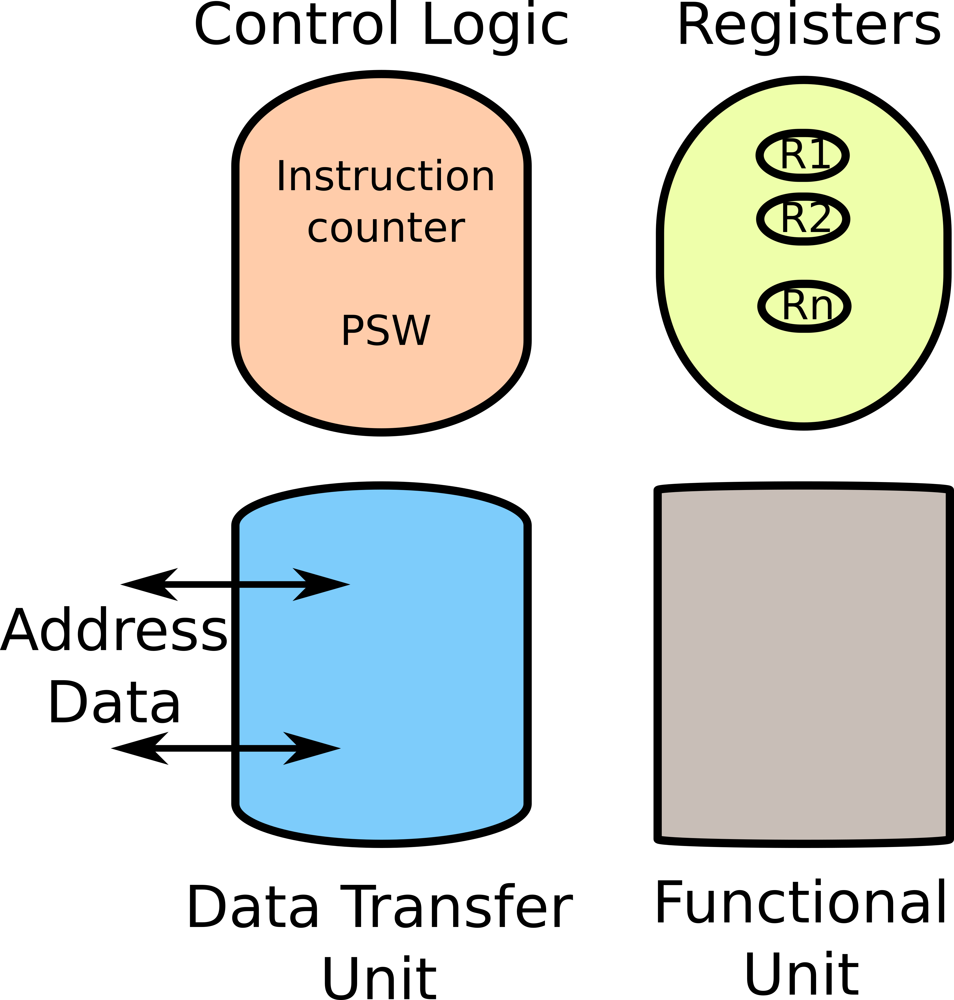

In [53]:
Image("cpu_layout.svg.png")

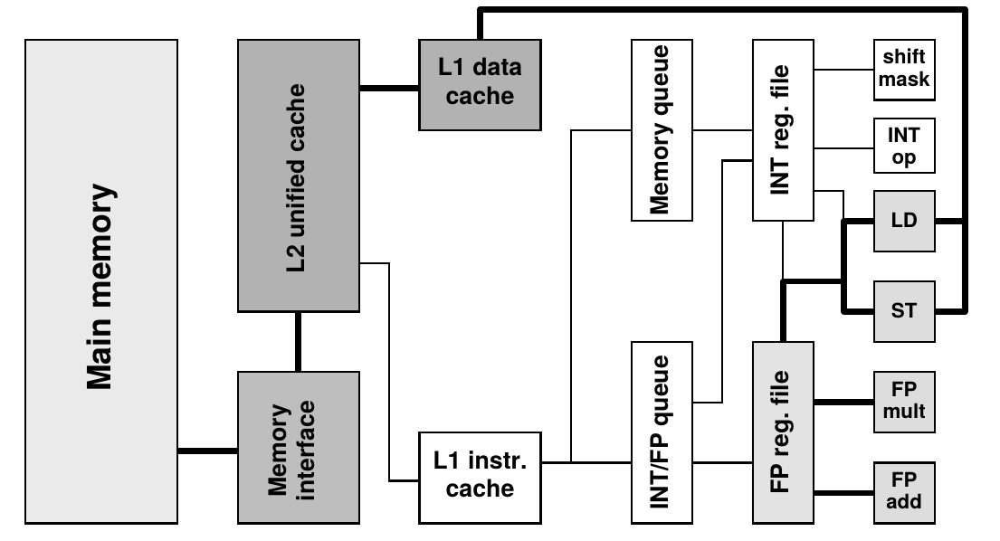

In [54]:
Image("onecore.png")

Instructions and data must be continuously fed to the control and arithmetic units, so that the speed of the memory interface poses a limitation on compute performance (*von Neumann bottleneck*). 

The architecture is inherently sequential, processing a single instruction with (possibly) a single operand or a group of operands from memory. SISD (Single Instruction Single Data) has been coined for this concept.

All the components of a CPU core can operate at some maximum speed called *peak performance*

The performance at which the Floating Point units generate results for multiply and add operations is measured in floating-point operations per second (Flops/sec).  
Typical single core perfomances for latest (e. g. Coffee lake) Intel architectures reach about 100 GFlop/s.  

Feeding arithmetic units with operands is a complicated task. The most important data paths from the programmer’s point of view are those to and from the caches and main memory (see later). The performance, or bandwidth of those paths is quantified in GBytes/s.

Fathoming the chief performance characteristics of a processor or system is one of the purposes of *low-level benchmarking* such as the *vector triad*

    double start end,mflops;
    timing(&start); //a generic timestamp function
    
    for(k=0; k<NITER; k++) 
    {
        for(i=0; i<N; ++i)
            a[i] = b[i] + c[i] * d[i];
        if(a[2]<0.) dummy(a,b,c,d); //prevent optimization
    }
    
    timing(&end);
    mflops=2.0*NITER*N/(end-start)/1000000.0;

### Performance dimensions in the good old days

Two dimensions:
     - Frequency of CPU
     - number of CPUs

### Performance dimensions now

we got seven:

1. Pipelining
2. Superscalar
3. Hardware vectors/SIMD
4. Hardware threads
5. Cores
6. Sockets
7. Nodes

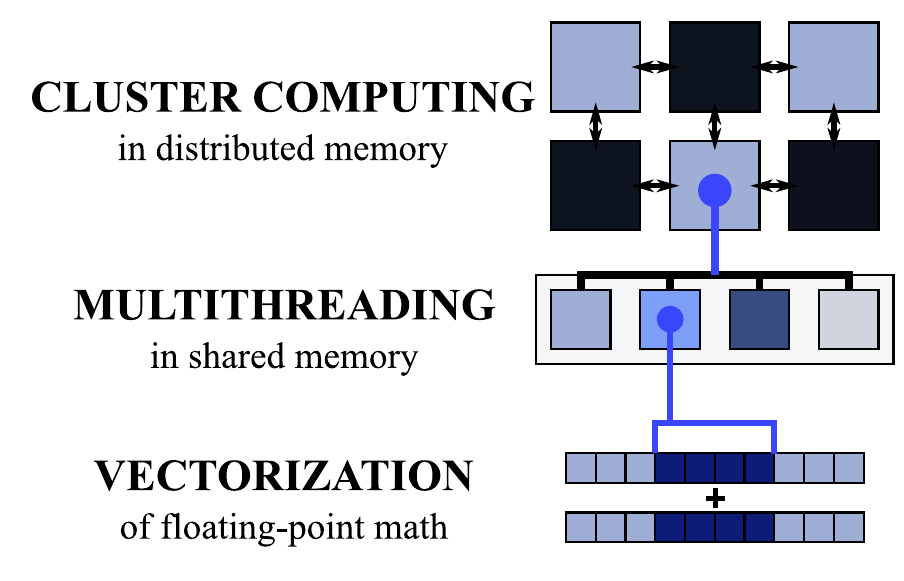

In [55]:
Image("perfo_dim.png")

**1.Latency**
    - Each instruction takes a certain time to complete.
    - Amount of time between instruction issuing and completition
 
**Throughput**
    - The number of instructions that complete in a span of time.

#### Pipelining and ILP wall

Assembly line: workstations that perform a single production step before passing the partially completed automobile to the next workstation. 
When Henry Ford(1) introduced it in 1920, 31 workstations could  assemble a Model T car in about 1,5 hrs. 

Early platforms such in 1960 used to have multiple parallel units (i. e. multiple workers) performing arithmetic and logic operations.

The first "dedicated workers" performing tasks a single task before passing data to the next were introduced in the Cray-1 which had a pipeline of 12 stages.

If it takes *m* different steps to finish the product, *m* products are continually worked on in different stages of completion. If all tasks are carefully tuned to take the same amount of time (the “time step”), all workers are continuously busy. At the end, one finished product per time step leaves the assembly line.

The most simple setup is a “fetch–decode–execute” pipeline, in which each stage can operate indepen- dently of the others. While an instruction is being executed, another one is being decoded and a third one is being fetched from instruction (L1I) cache.

Breaking up tasks in many different elementary stages (one of the reasons behind RISC):

- The Good: potential for a higher clock rate as functional units can be kept simple.

- The Bad: the more deep the pipeline, the more long is the *wind up phase* that is needed for all units to become operational

- The Evil: Only so many pipeline stages, possible conflicts

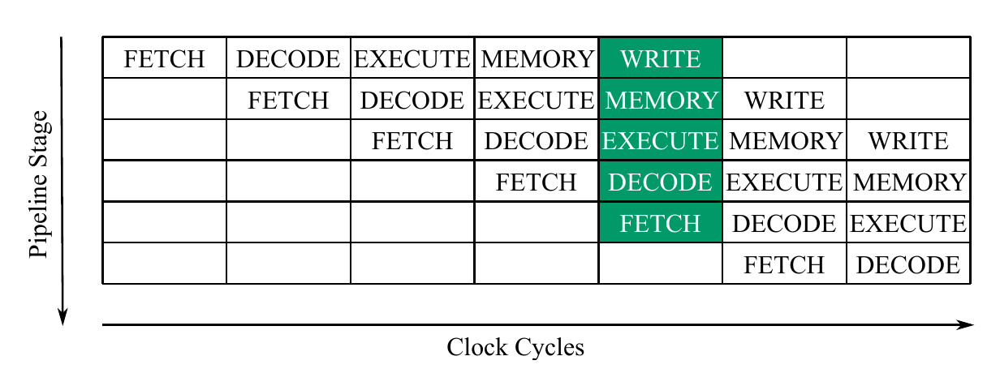

In [56]:
Image("ILP_wall.png")

For a pipeline of depth $m$, executing $N$ independent, subsequent operations takes $N + m − 1$ steps. We can thus calculate the expected speedup versus a general-purpose unit that needs $m$ cycles to generate a single result:

$$ \frac{T_{seq}}{T_{pipe}} = \frac{mN}{N+m-1} $$

Troughtput is:
$$ \frac{N}{T_{pipe}} = \frac{1}{N+m-1} $$

that is for large $N$ speedup $\propto m$ and troughput $\propto 1$. The critical $N_c$ needed to achieve at least a throughput of $p$ ($0\leq p \leq 1$):
$$ N_c = \frac{p(m-1)}{1-p} $$

At $p=0.5$ $N_c=m-1$. Think how to manage a pipeline of depth 20 to 30 and possible slow operations (e. g. trascendent functions).

**Digression**: maybe this was not invented by Ford actually. Do you know what is that:

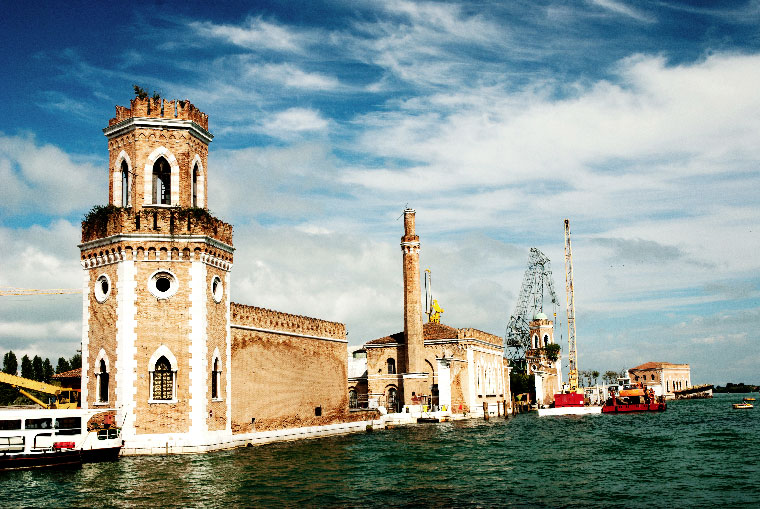

In [57]:
Image("ars2.jpg")

#### Superscalar Execution and ILP Wall

- Multiple instructions can be fetched and decoded concurrently.
- Address and other integer calculations are performed in multiple integer (add,mult, shift, mask) units (2–6). 
- Multiple floating-point pipelines can run in parallel. Often there are one or twocombined multiply-add pipes that perform a=b+c\*d with a throughput of one each.
- Caches are fast enough to sustain more than one load or store operation per

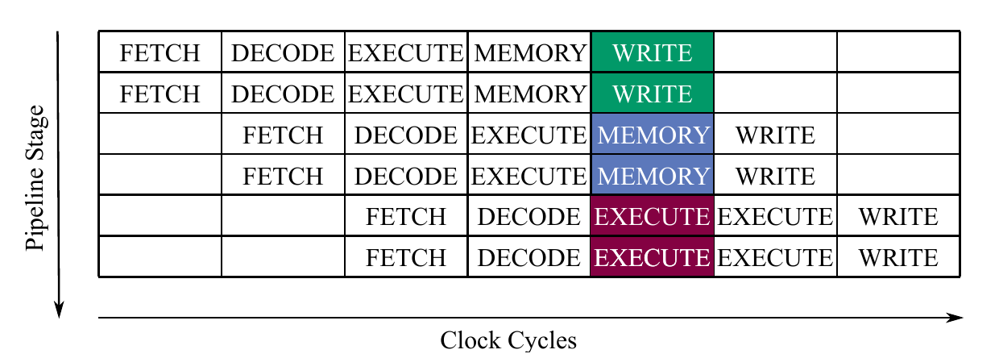

In [58]:
Image("superscalar.png")

But ... automatic search for independent instructions reqiures extra resources

#### Out-of-Order Execution and Memory Wall

Out-of-order execution. If arguments to instructions are not available in registers “on time,” e.g., because the memory subsystem is too slow to keep up with processor speed, out-of-order execution can avoid idle times (also called stalls) by executing instructions that appear later in the instruction stream but have their parameters available. This improves instruction throughput and makes it easier for compilers to arrange machine code for optimal performance. Current out-of-order designs can keep hundreds of instructions in flight at any time, using a reorder buffer that stores instructions until they become eligible for execution.

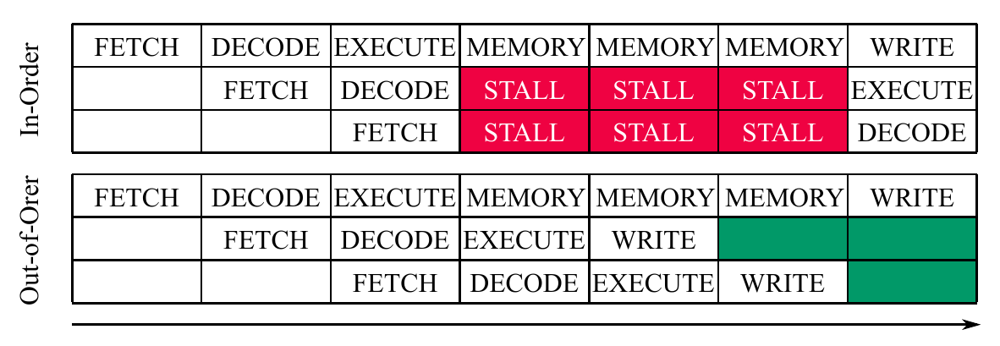

In [59]:
Image("ooe.png")

#### Vector registers

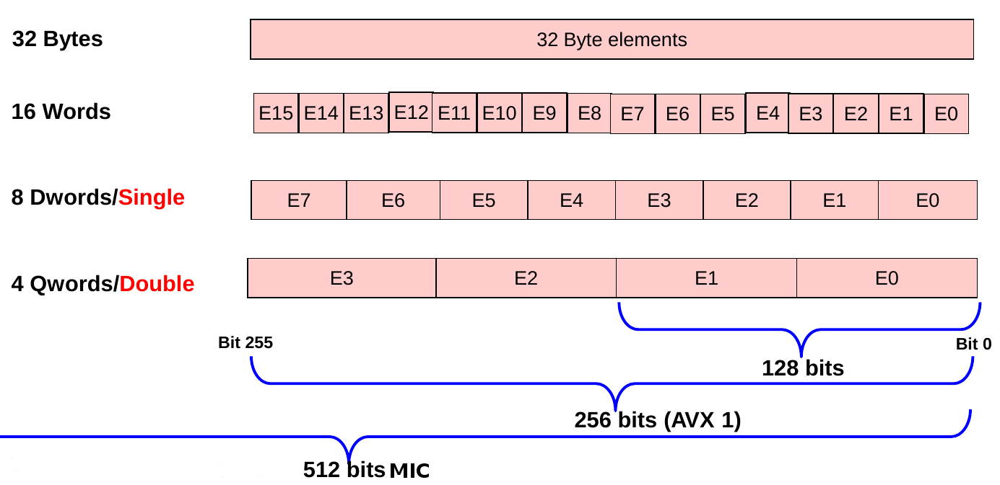

In [60]:
Image("vectors.png")

- AltiVec
- MMX
- SSE2
- SSE3
- SSE4
- 3DNow!
- AVX1
- AVX2

#### Larger caches

Small, fast, on-chip memories serve as temporary data storage for holding copies of data that is to be used again “soon,” or that is close to data that has recently been used. Enlarging the cache size does usually not hurt application performance, but there is some tradeoff because a big cache tends to be slower than a small one.  
Also:

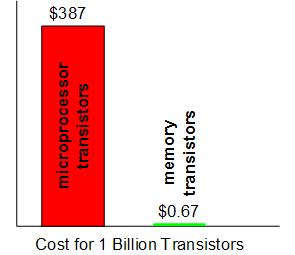

In [61]:
Image("transisto_cores.jpg")

#### Hardware threads

Pipelined architectures, however performant, will inevitably have stalls. One way to minimize the cost of stalls would be to be keep stalling units (workstations of the assembly line) in the execution of one program occupied by another one. This is called Hardware threading or multithreading or hyper-threading.  

Multithreading is implemented by creating multiple sets of registers and latches to hold the state of the multiple programs. The correct register set can be selected for the right pipeline resource by a very smart compiler

### Real life latencies

Most integer/logic instructions have a one-cycle execution latency:
- ADD, AND, SHL (shift left), ROR (rotate right)
- Amongst the exceptions:
- IMUL (integer multiply): 3
- IDIV (integer divide): 13 – 23

Floating-point latencies are typically multi-cycle:
- FADD (3), FMUL (5)
- Same for both x87 and SIMD double-precision variants
- Exception: FABS (absolute value): 1
- Many-cycle: FDIV (20), FSQRT (27)

# Conclusions

... too early but

- You must get your code to use vectors
- You must understand if your ILP is seriously limited by serial code, complex math functions, and other contracts
- You must parallelise across all “CPU slots”
- Hardware threads, Cores, Sockets

if you really need to get as much as possible from this:

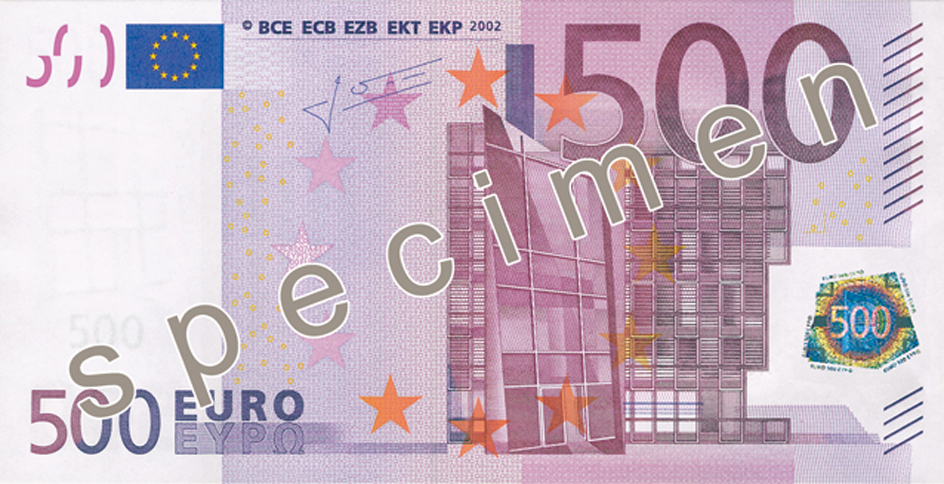

In [62]:
Image("500eurofr_HR.jpg")